In [1]:
from __init__ import DATASET_PATH

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error, root_mean_squared_error
from tqdm import tqdm

from sklearn.preprocessing import RobustScaler, StandardScaler, PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, KNNImputer, IterativeImputer
from sklearn.model_selection import cross_val_score, cross_validate, cross_val_predict
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import RepeatedKFold

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score
from sklearn.metrics import PredictionErrorDisplay
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.neighbors import KNeighborsClassifier




from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import SelectKBest, r_regression, f_regression, mutual_info_regression, RFECV

from tpot import TPOTRegressor


from textwrap import wrap

from main.components.scaler import Scaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsRegressor


from main.components.imputer import Imputer
from main.components.one_hot_encoder import CustomOneHotEncoder
from main.constants import CATEGORICAL_ATTRIBUTES, CONTINUOUS_ATTRIBUTES, PROLACTIN, VITAMINE_D, PCO, prolactin_associated_features, inflammatory_attributes
from main.components.preprocessing_methods import remove_outliers, get_continuous_attributes_except, explore_all_variations_of_preprocessing
from main.components.hyperparameter_tuning_methods import hyperparameter_tuning_general, hyperparameter_tuning_linear, compare_random_states, train_model
from main.components.feature_importance_methods import get_feature_importance_lasso, get_feature_importance_tree, get_feature_importance_knn, get_feature_importance_rf, rename_importnace_col, merge_feature_importances, rank_importances, feature_selection_mutual_info_regression, recursive_feature_elimination, get_permutation_importance


import nest_asyncio
nest_asyncio.apply()

pd.set_option('display.max_columns', None) # enable showing all columns of the df
pd.set_option('display.max_rows', None)
pd.set_option("display.expand_frame_repr", True)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', None)


In [2]:
dataset_file_path = DATASET_PATH
raw_df = pd.read_csv(dataset_file_path)
raw_df.sample(5)

,"PCO 0-healthy control, 1-PCOS, 2-FHA 3-POF, 4-High Andro",IGF-1 ng/ml (N: 100-311),proBNP,"AMH (ng/ml) *7,14=pmol/l",weight,height (cm),BMI,systolic BP (ciśnienie skurczowe),diastolic BP (ciśnienie rozskurczowe),Hypertension,Waist Circumference (WC),WC>88,Hip Circumference (HC),WHR (Waist/Hip ratio),"WHR>0,85 (WHO)","WHR>0,8 (NIDDK)",WHTR (Waist/Height Ratio),"WHTR>0,5","overweight/obesity 0-normal/low, 1-overweight, 2-obesity","irregular cycles (0-nie, 1-tak)","ovulation (0-brak, 1-obecna)","PCO ovary morfology in USG (0-brak, 1--obecna)","stromal hypertrophy in ovary (0-brak, 1-obecny)",acne,hirsutism,FG score (Ferriman-Gallway score - stopień androgenizacji),hyperandrogenism,elevated DHT,hypothyroidism,Volume of the thyroid Right Lobe,Volume of the thyroid Left Lobe,thyroid volume,"nodules 0-lack, 1-RL, 2-LL, 3-both",chronic thyroiditis,Vole of the Right Ovary,Volume of the Left Ovary,ovaries volume - total,follicules >12,WBC x10^3/ul,neutrophil x10^3/ul,lymphocytes x10^3/ul,monocytes x10^3/ul,eosinocytes x10^3/ul,basophils x10^3/ul,% neutrophil,% lymphocytes,% monocytes,%eosinocytes,%basophils,RBC x10^6ul,Hemoglobin [g/dl],hematocrit [%],HTC/Hb,MCV fl,MCH pg,MCHC g/dl,RDW-CV %,PLT x10^3/ul,PDW fl,MPV fl,P-LCR %,PLT/WBC,MPV/PLT,PLR,limf/mono,NLR (stosunek neutrofili do limfocytów),L/WCC (leukocyty do całkowitej liczby krwinek białych),eos/leukocyty,sodium mmol/l,potassium mmol/l,calcium mg/dl,phosphorus mg/dl,creatinine mg/dl,CRP mg/l,ALT U/l,AST U/l,Bilirubin mg/dl,CHOL mmol/l,CHOL>200,HDL mmol/l,HDL<50,LDL mmol/l,LDL>135,TG mmol/l,Atherogenic index (AI) (LDL-C/HDL-C),coronary risk index (CRI) (TG/HDL-C),VAI - Visceral adiposity index,BAI - Body adiposity index,LAP INDEX - Lipid accumulation product index,TyG Index - Trigliceride-glucose index,AIP -Atherogenic index of plasma,UIBC ug/dl,ferrum ug/dl,TIBC,TSAT,ferritin ng/ml,glucose 0 mg/dl,glucose 120 mg/dl,insulin 0 uU/ml,Insulin 120 uU/ml,HOMA,Matsuda,"QUICKI (N<0,357)",TSH mIU/L,FT3 pmol/l,FT4 pmol/l,Anty-TPO IU/ml,Anty-TG IU/ml,FSH mlU/ml,LH,LH/FSH,prolactin,DHEA-S ug/dl,testosterone nmol/l,T (ng/ml),T/SHBG,E(pg/ml)/T(ng/ml)/,Parathormone pg/ml,cortisol nmol/l 8:00,cortisol nmol/l 18:00,Estradiol pg/ml,SHBG nmol/l,SHBG>110,FTI (free testosterone index),ACTH pg/ml,HbA1c %,vitamin 25-OH D ng/ml,Androstendione ng/ml,17-OH-progesterone ng/ml,Dihydrotestosterone pg/ml (N<368),Testosterone/DHT,T/A (testosterone/androstendione),age
423,1,255.0,52.63,12.120000,58.0,164.0,21.564545,111.0,63.0,0.0,77.0,0.0,79.0,0.974684,1.0,1.0,0.469512,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,16.0,1.0,1.0,0.0,5.880,3.1265,9.0065,0.0,0.0,13.00,11.23,24.23,1.0,6.21,4.06,1.70,0.38,0.04,0.03,65.4,27.4,6.1,0.6,0.5,4.23,12.5,37.9,3.032000,89.6,29.6,33.0,12.6,263.0,12.9,10.9,32.6,42.351047,0.041445,154.705882,4.473684,2.388235,0.273752,0.006441,141.0,4.24,9.75,2.71,0.78,0.3,19.0,21.0,0.76,3.69798,0.0,2.17224,0.0,1.298172,0.0,0.54192,0.597619,0.571429,0.466111,30.170732,10.29648,4.156926,-0.243038,146.0,150.0,296.0,51.0,101.0,85.0,83.0,5.48,25.43,1.150123,12.85,0.374785,2.40,4.66,15.13,14.0,10.0,3.5,8.9,2.542857,444.0,247.0,2.4,0.691643,0.029197,530.620830,48.44,276.0,190.0,367.0,82.2,0.0,2.86,12.25,4.9,32.0,4.24,3.15,382.0,0.006283,0.566038,23.0
19,0,NaN,NaN,NaN,52.0,155.0,21.644121,92.0,72.0,0.0,56.0,0.0,78.0,0.717949,0.0,0.0,0.361290,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,8.0,0.0,0.0,1.0,4.165,2.8080,6.9730,0.0,1.0,2.71,8.27,10.98,0.0,5.26,2.55,1.71,0.69,0.26,0.05,48.5,32.5,13.1,4.9,1.0,3.92,11.7,34.9,2.982906,89.0,29.8,33.5,13.3,218.0,14.5,11.9,39.6,41.444867,0.054587,127.485380,2.478261,1.491228,0.325095,0.049430,140.0,4.59,9.77,NaN,0.66,NaN,14.0,17.0,NaN,4.31862,0.0,1.60332,0.0,2.084316,0.0,1.37738,1.300000,1.967742,1.165062,32.322581,-2.75476,4.673658,0.293968,NaN,NaN,NaN,NaN,26.0,94.0,74.0,15.92,22.60,3.695012,6.42,0.314954,3.97,5.23,16.98,25.0,10.0,1.9,2.4,1.263158,266.0,267.0,0.8,0.230548,0.010989,524.837496,NaN,453.0,204.0,121.0,72.8,0.0,1.13,23.50,NaN,NaN,2.76,3.05,223.0,0.003587,0.289855,17.0
727,1,NaN,

### Handle `prolactin` outliers

Left only the values within the interval: [-421.26, 1222.93]
Removed 15 outlier values of prolactin -> 1.74 % of all the not null examples


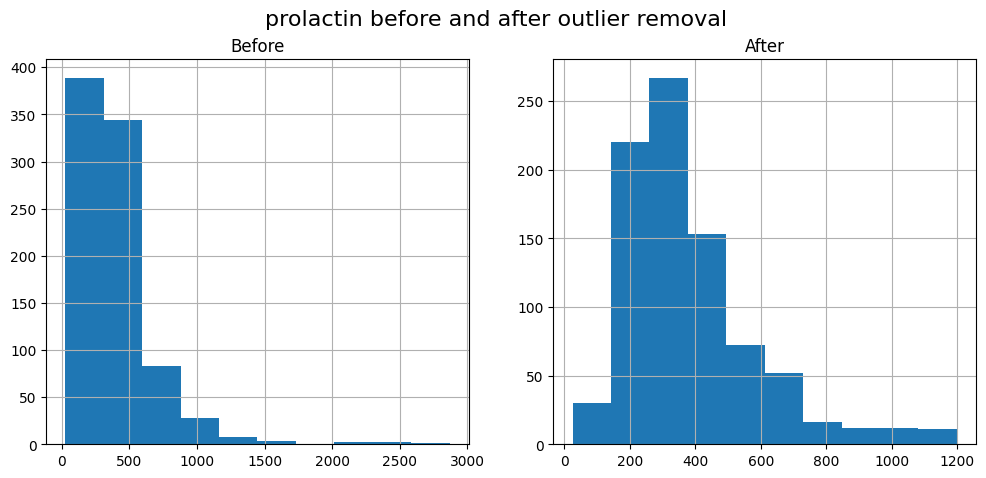

In [3]:
df = remove_outliers(raw_df, PROLACTIN)

In [4]:
df_prolactin_cleaned = df.dropna(subset=[PROLACTIN])

X_prolactin, y_prolactin = df_prolactin_cleaned.drop(columns=[PROLACTIN]), df_prolactin_cleaned[PROLACTIN]
X_train_prolactin, X_test_prolactin, y_train_prolactin, y_test_prolactin = train_test_split(X_prolactin, y_prolactin, test_size=0.2, random_state=42)

In [5]:
continuous_preprocessor_tree_hyperparam_tuning = Pipeline([('imputer', KNNImputer(n_neighbors=10))])
continuous_preprocessor_tree = Pipeline([('imputer',  IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))])


continuous_preprocessor_hyperparam_tuning = Pipeline([('scaler', PowerTransformer()), ('imputer', KNNImputer(n_neighbors=10))])
continuous_preprocessor =  Pipeline([('scaler', PowerTransformer()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))])


categorical_preprocessor = Pipeline([
    ('imputer', IterativeImputer(estimator=KNeighborsClassifier(n_neighbors=10, n_jobs=-1), max_iter=40, initial_strategy='most_frequent')),
    ('one_hot_encoder', OneHotEncoder(handle_unknown='error', drop='if_binary'))
    ])

## Hyperparameter tuning

In [13]:


models = [
        LinearRegression(),
        Lasso(),
        Ridge(),
        KNeighborsRegressor(),
        ]


continuous_preprocessings = {
    # 'Min Max': Pipeline([('scaler', MinMaxScaler()), ('imputer', KNNImputer(n_neighbors=10))]),
    # 'Standard Scaler': Pipeline([('scaler', StandardScaler()), ('imputer', KNNImputer(n_neighbors=10))]),
    # 'Power Transformer': Pipeline([('scaler', PowerTransformer()), ('imputer', KNNImputer(n_neighbors=10))]),
    
    'Min Max': Pipeline([('scaler', MinMaxScaler()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))]),
    'Standard Scaler': Pipeline([('scaler', StandardScaler()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))]),
    'Power Transformer': Pipeline([('scaler', PowerTransformer()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))]),
}

categorical_preprocessings = {
    'ii_imputer': Pipeline([('imputer', IterativeImputer(estimator=KNeighborsClassifier(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='most_frequent')), ('one_hot_encoder', OneHotEncoder(handle_unknown='error', drop='if_binary'))]),
}


scores_df = explore_all_variations_of_preprocessing(X_train_prolactin, y_train_prolactin, PROLACTIN, models, continuous_preprocessings, categorical_preprocessings)
scores_df.sort_values(by='neg_mean_absolute_error', ascending=True)

1/12 LinearRegression() Min Max ii_imputer [-185.35294118 -207.23333333 -161.0962963  -188.33425926 -238.14074074
 -160.46247339 -225.95925926 -172.14074074 -148.22962963 -204.23703704
 -150.06617647 -174.41666667 -274.95740741 -159.17962963 -198.6587963 ] 189.89769248905614
2/12 Lasso() Min Max ii_imputer [-128.49191334 -125.75634746 -148.68243569 -145.30793973 -131.40274295
 -148.39001754 -136.19607017 -137.23018936 -138.72560463 -129.36473893
 -115.26972603 -138.73248227 -133.41408171 -139.63010793 -159.10184734] 137.04641633833253
3/12 Ridge() Min Max ii_imputer [-139.57479559 -138.41489817 -148.20175758 -150.11661459 -138.18742349
 -153.50662152 -145.35290476 -149.46025785 -135.38762975 -140.91590214
 -121.50185038 -145.3820536  -136.79167037 -140.88540259 -166.82882046] 143.36724018911
4/12 KNeighborsRegressor() Min Max ii_imputer [-148.10441176 -150.67703704 -174.2237037  -176.27111111 -154.30074074
 -165.10441176 -152.0562963  -153.32       -166.14962963 -164.72740741
 -149.938

,continuous_preprocessing,categorical_pteprocessing,model,neg_mean_absolute_error
1,Min Max,ii_imputer,Lasso(),137.046416
9,Power Transformer,ii_imputer,Lasso(),138.444343
5,Standard Scaler,ii_imputer,Lasso(),142.596228
2,Min Max,ii_imputer,Ridge(),143.367240
10,Power Transformer,ii_imputer,Ridge(),148.528887
7,Standard Scaler,ii_imputer,KNeighborsRegressor(),156.657992
11,Power Transformer,ii_imputer,KNeighborsRegressor(),157.532365
8,Power Transformer,ii_imputer,LinearRegression(),159.804305
3,Min Max,ii_imputer,KNeighborsRegressor(),160.322693
6,Standard Scaler,ii_imputer,Ridge(),166.106191


### Lasso

Fitting 15 folds for each of 5 candidates, totalling 75 fits
Best parameters: {'model__alpha': 5}
Best score (neg_mean_absolute_error): -133.58902165752949


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


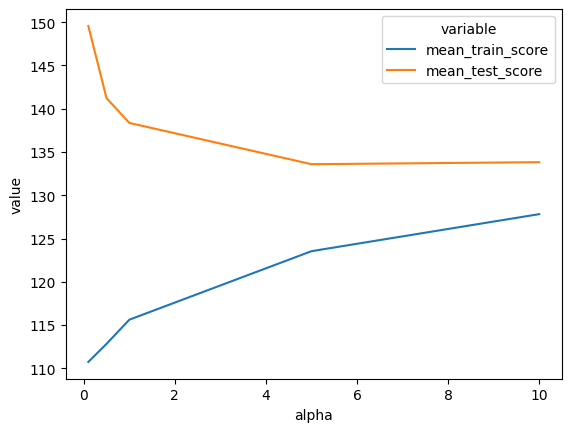

,alpha,mean_train_score,mean_test_score
0,0.1,110.745627,149.564509
1,0.5,112.834888,141.220853
2,1,115.622905,138.357556
3,5,123.540267,133.589022
4,10,127.818805,133.823087


In [9]:
lasso_model = Lasso()

lasso_param_grid = {
    "model__alpha": [0.1, 0.5, 1, 5, 10],
    }



prolactin_lasso_model_hyperparam_tuning_df = hyperparameter_tuning_linear(X_train_prolactin, y_train_prolactin, PROLACTIN, Lasso(), continuous_preprocessor_hyperparam_tuning, categorical_preprocessor, lasso_param_grid, main_parameter='alpha')
prolactin_lasso_model_hyperparam_tuning_df

Chosen alpha: 2

### KNN

Fitting 15 folds for each of 7 candidates, totalling 105 fits
Best parameters: {'model__n_neighbors': 16}
Best score (neg_mean_absolute_error): -150.8483925653595


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


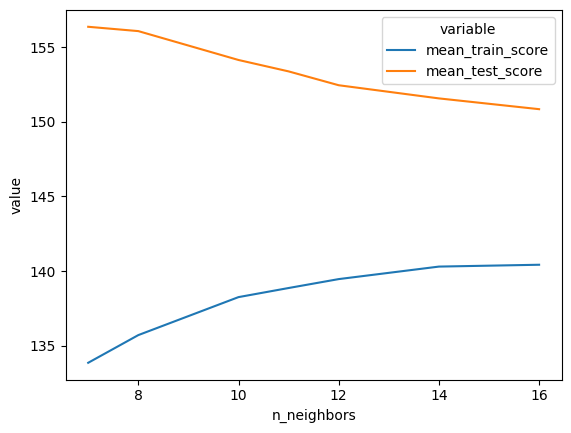

,n_neighbors,mean_train_score,mean_test_score
6,16,140.419970,150.848393
5,14,140.296430,151.570785
4,12,139.458018,152.452714
3,11,138.860417,153.381104
2,10,138.250435,154.145538
1,8,135.703998,156.081593
0,7,133.848379,156.371474


In [11]:
from sklearn.neighbors import KNeighborsRegressor


knn_model = KNeighborsRegressor()

# chosen k=12

knn_param_grid = {
    'model__n_neighbors': [7, 8, 10, 11, 12, 14, 16],  # Number of neighbors to consider
    # 'model__weights': ['uniform', 'distance'],  # Weight function used in prediction
    # 'model__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],  # Algorithm used to compute the nearest neighbors
    # 'model__leaf_size': [20, 30, 40, 50],  # Leaf size passed to BallTree or KDTree
    # 'model__p': [1, 2]  # Power parameter for Minkowski metric (1 for Manhattan distance, 2 for Euclidean distance)
}

knn_hyperparam_tuning_df = hyperparameter_tuning_linear(X_train_prolactin, y_train_prolactin, PROLACTIN, knn_model, continuous_preprocessor, categorical_preprocessor, knn_param_grid, main_parameter='n_neighbors')
knn_hyperparam_tuning_df.sort_values(by='mean_test_score')

### Ridge

Fitting 15 folds for each of 6 candidates, totalling 90 fits


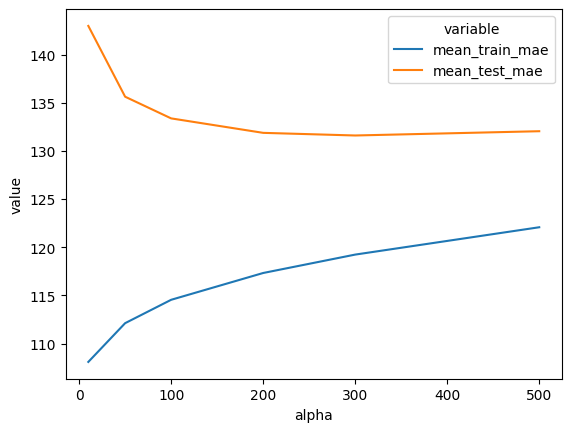

,alpha,mean_train_mae,mean_test_mae
0,10,108.104635,142.972337
1,50,112.126221,135.625787
2,100,114.551525,133.376907
3,200,117.332797,131.875968
4,300,119.242352,131.602389
5,500,122.079614,132.045416


In [19]:
ridge_param_grid = {
    "model__alpha": [10, 50, 100, 200, 300, 500],
    }

prolactin_ridge_model_hyperparam_tuning_df =  hyperparameter_tuning_linear(X_train_prolactin, y_train_prolactin, PROLACTIN, Ridge(), continuous_preprocessor, categorical_preprocessor, ridge_param_grid, main_parameter='alpha')
prolactin_ridge_model_hyperparam_tuning_df

Chosen alpha: 100

### Decision Tree Regressor

In [89]:
tree_param_grid = {
    "model__criterion": ["squared_error", "absolute_error", "poisson", "friedman_mse"],
    "model__max_depth": [7, 10, 15, 20, 25, 30],
    "model__splitter": ["random"],
    "model__min_samples_split": [15, 30],
    "model__min_samples_leaf": [10, 20],
    }

tree_model_hyperparam_tuning_df = hyperparameter_tuning_general(X_train_prolactin, y_train_prolactin, PROLACTIN, DecisionTreeRegressor(), continuous_preprocessor, categorical_preprocessor, tree_param_grid)
tree_model_hyperparam_tuning_df.sort_values(by='mean_test_score')

Fitting 15 folds for each of 96 candidates, totalling 1440 fits


,params,mean_train_mae,mean_test_mae
46,"{'model__criterion': 'absolute_error', 'model__max_depth': 30, 'model__min_samples_leaf': 20, 'model__min_samples_split': 15, 'model__splitter': 'random'}",118.772749,141.538580
34,"{'model__criterion': 'absolute_error', 'model__max_depth': 15, 'model__min_samples_leaf': 20, 'model__min_samples_split': 15, 'model__splitter': 'random'}",119.152383,142.766080
42,"{'model__criterion': 'absolute_error', 'model__max_depth': 25, 'model__min_samples_leaf': 20, 'model__min_samples_split': 15, 'model__splitter': 'random'}",118.813298,142.829139
39,"{'model__criterion': 'absolute_error', 'model__max_depth': 20, 'model__min_samples_leaf': 20, 'model__min_samples_split': 30, 'model__splitter': 'random'}",119.585455,143.131630
27,"{'model__criterion': 'absolute_error', 'model__max_depth': 7, 'model__min_samples_leaf': 20, 'model__min_samples_split': 30, 'model__splitter': 'random'}",119.421653,143.444539
30,"{'model__criterion': 'absolute_error', 'model__max_depth': 10, 'model__min_samples_leaf': 20, 'model__min_samples_split': 15, 'model__splitter': 'random'}",119.309915,143.462271
38,"{'model__criterion': 'absolute_error', 'model__max_depth': 20, 'model__min_samples_leaf': 20, 'model__min_samples_split': 15, 'model__splitter': 'random'}",118.887667,143.549399
31,"{'model__criterion': 'absolute_error', 'model__max_depth': 10, 'model__min_samples_leaf': 20, 'model__min_samples_split': 30, 'model__splitter': 'random'}",118.850801,143.821541
26,"{'model__criterion': 'absolute_error', 'model__max_depth': 7, 'model__min_samples_leaf': 20, 'model__min_samples_split': 15, 'model__splitter': 'random'}",119.965071,144.142315
43,"{'model__criterion': 'absolute_error', 'model__max_depth': 25, 'model__min_samples_leaf': 20, 'model__min_samples_split': 30, 'model__splitter': 'random'}",117.832758,144.845837


In [ ]:
model = DecisionTreeRegressor(criterion="absolute_error", max_depth=15, min_samples_leaf=20, min_samples_split=15, splitter='random')

tuned_df = compare_random_states(X_train_prolactin, y_train_prolactin, model, PROLACTIN, continuous_preprocessor, categorical_preprocessor)
tuned_df.sort_values(by='cv_mae', ascending=False).head(5)

In [90]:
param_grid_rf = {
    'model__criterion': ['absolute_error'],
    'model__n_estimators': [100, 200],
    'model__max_features': ['sqrt', 'log2'],
    'model__max_depth': [None],
    'model__min_samples_split': [5, 10, 15],
    'model__min_samples_leaf': [3, 5, 10, 15],
}

tree_model_hyperparam_tuning_df = hyperparameter_tuning_general(X_train_prolactin, y_train_prolactin, PROLACTIN, RandomForestRegressor(), continuous_preprocessor, categorical_preprocessor, param_grid_rf)
tree_model_hyperparam_tuning_df.sort_values(by='mean_test_score')

Fitting 15 folds for each of 48 candidates, totalling 720 fits


,params,mean_train_mae,mean_test_mae
17,"{'model__criterion': 'absolute_error', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 10, 'model__min_samples_split': 15, 'model__n_estimators': 200}",106.691362,132.739884
19,"{'model__criterion': 'absolute_error', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 15, 'model__min_samples_split': 5, 'model__n_estimators': 200}",113.490329,132.744639
16,"{'model__criterion': 'absolute_error', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 10, 'model__min_samples_split': 15, 'model__n_estimators': 100}",106.751302,132.836743
23,"{'model__criterion': 'absolute_error', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 15, 'model__min_samples_split': 15, 'model__n_estimators': 200}",113.482256,133.018744
12,"{'model__criterion': 'absolute_error', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 10, 'model__min_samples_split': 5, 'model__n_estimators': 100}",106.822118,133.028398
21,"{'model__criterion': 'absolute_error', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 15, 'model__min_samples_split': 10, 'model__n_estimators': 200}",113.439099,133.061736
22,"{'model__criterion': 'absolute_error', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 15, 'model__min_samples_split': 15, 'model__n_estimators': 100}",113.367610,133.079064
13,"{'model__criterion': 'absolute_error', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 10, 'model__min_samples_split': 5, 'model__n_estimators': 200}",106.640264,133.082615
20,"{'model__criterion': 'absolute_error', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 15, 'model__min_samples_split': 10, 'model__n_estimators': 100}",113.444833,133.083857
18,"{'model__criterion': 'absolute_error', 'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 15, 'model__min_samples_split': 5, 'model__n_estimators': 100}",113.690313,133.215110


In [95]:
rf_model = RandomForestRegressor(n_estimators=100, max_depth=None, max_features='sqrt', min_samples_leaf=10, min_samples_split=15, criterion='absolute_error')

tuned_df = compare_random_states(X_train_prolactin, y_train_prolactin, rf_model, PROLACTIN, continuous_preprocessor, categorical_preprocessor)
tuned_df.sort_values(by='cv_mae', ascending=False).head(5)

100%|██████████| 99/99 [09:47<00:00,  5.93s/it]


,cv_mae
77,-131.976783
13,-131.980574
51,-132.062907
76,-132.249041
27,-132.250816


## Best models for prolactin

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


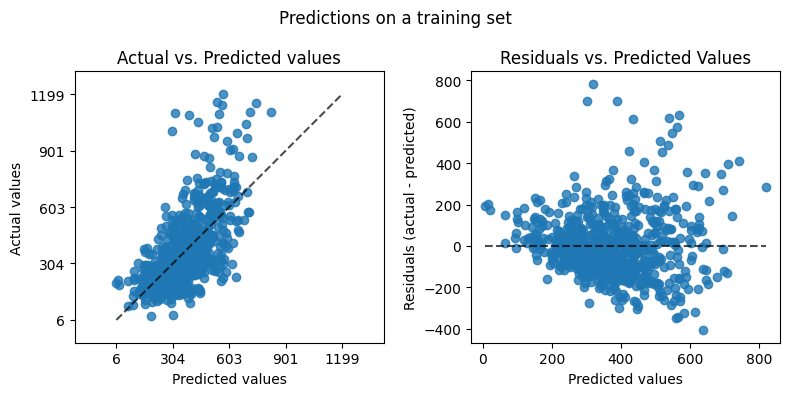

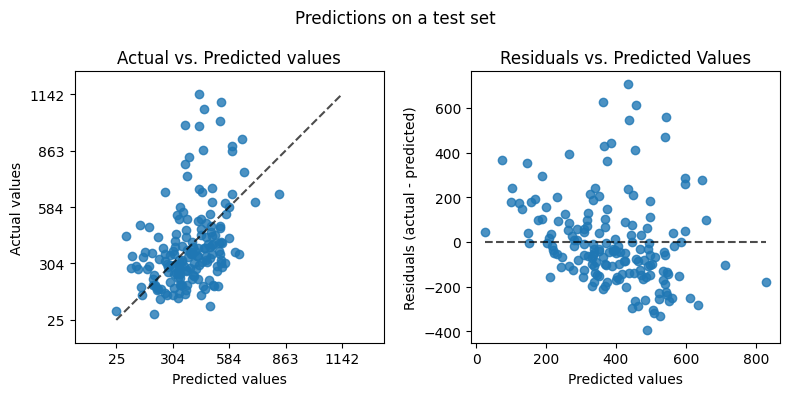

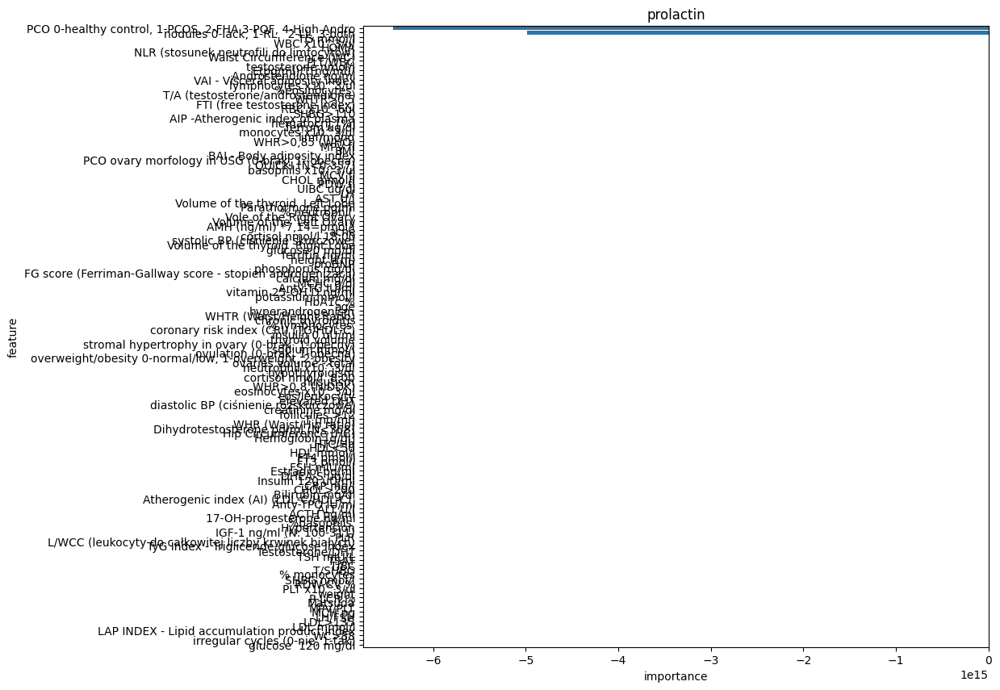

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,24126.494,115.280,155.327,0.386
1,LinearRegression(),test,39113.538,148.746,197.771,0.105


In [6]:
lr_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lr = train_model(lr_model, PROLACTIN, X_train_prolactin, y_train_prolactin, X_test_prolactin, y_test_prolactin, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


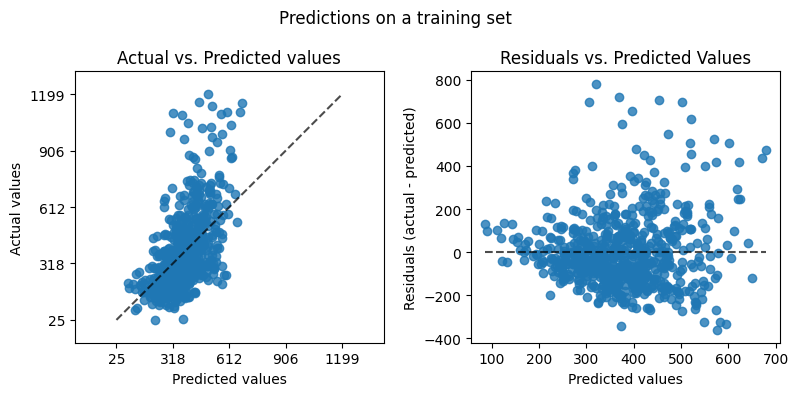

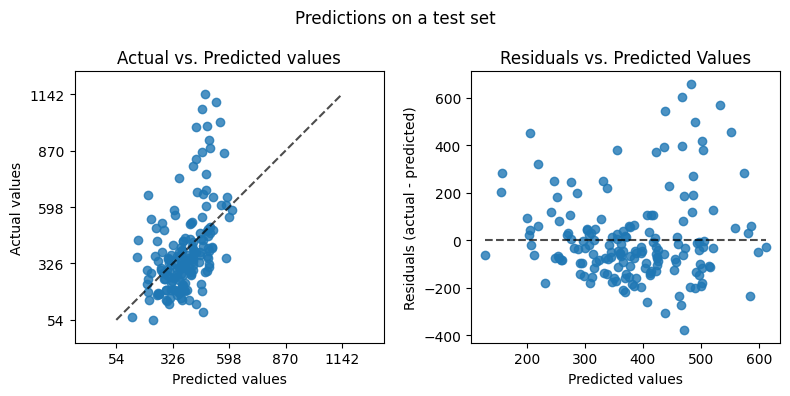

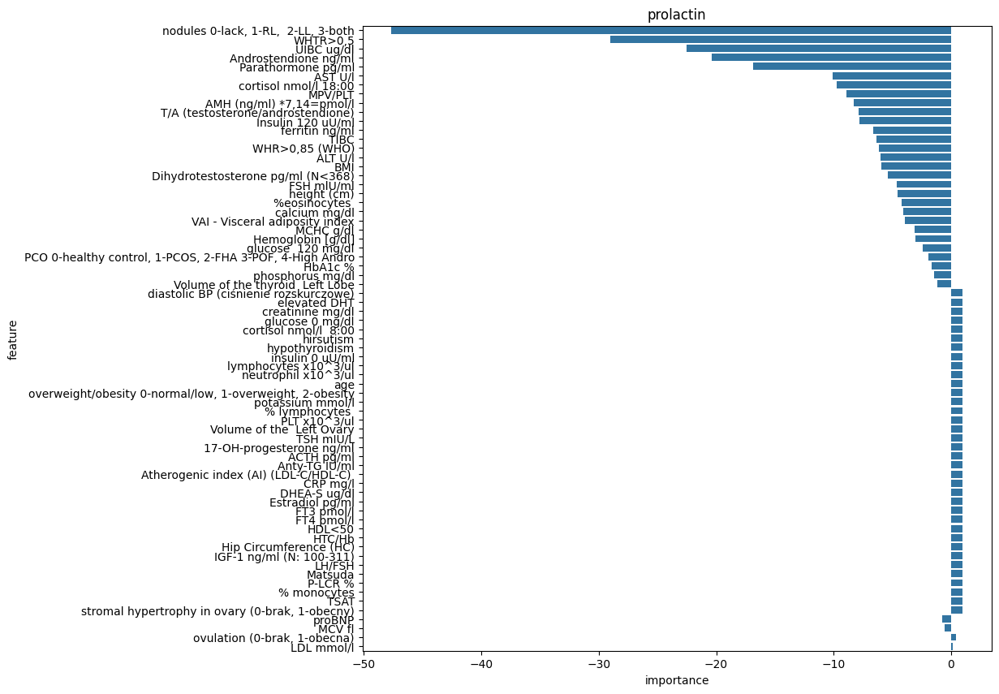

,model,data_set,mse,mae,rmse,r2
0,Lasso(alpha=2),training,27074.000,120.993,164.542,0.311
1,Lasso(alpha=2),test,33040.389,130.912,181.770,0.244


In [7]:
lasso_model = Lasso(alpha=2)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, PROLACTIN, X_train_prolactin, y_train_prolactin, X_test_prolactin, y_test_prolactin, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


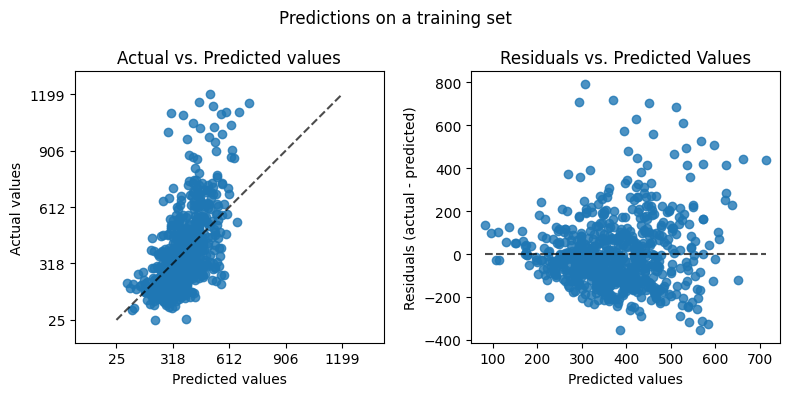

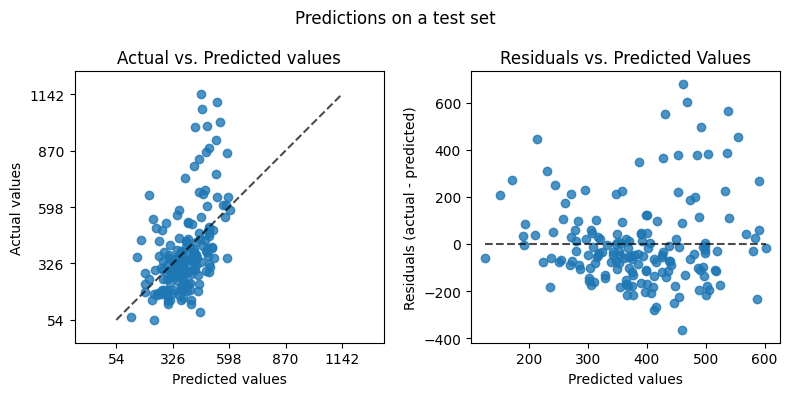

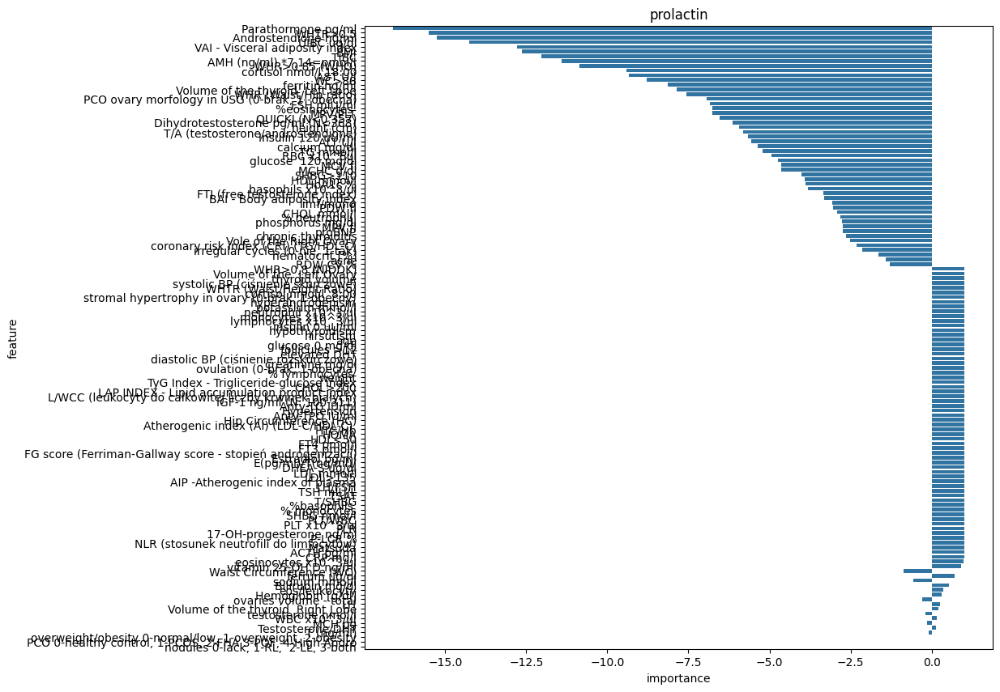

,model,data_set,mse,mae,rmse,r2
0,Ridge(alpha=100),training,26601.687,120.122,163.100,0.323
1,Ridge(alpha=100),test,32607.343,130.648,180.575,0.254


In [6]:
ridge_model = Ridge(alpha=100)

vit_d_model_scores_df, feature_importnces_ridge = train_model(ridge_model, PROLACTIN, X_train_prolactin, y_train_prolactin, X_test_prolactin, y_test_prolactin, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

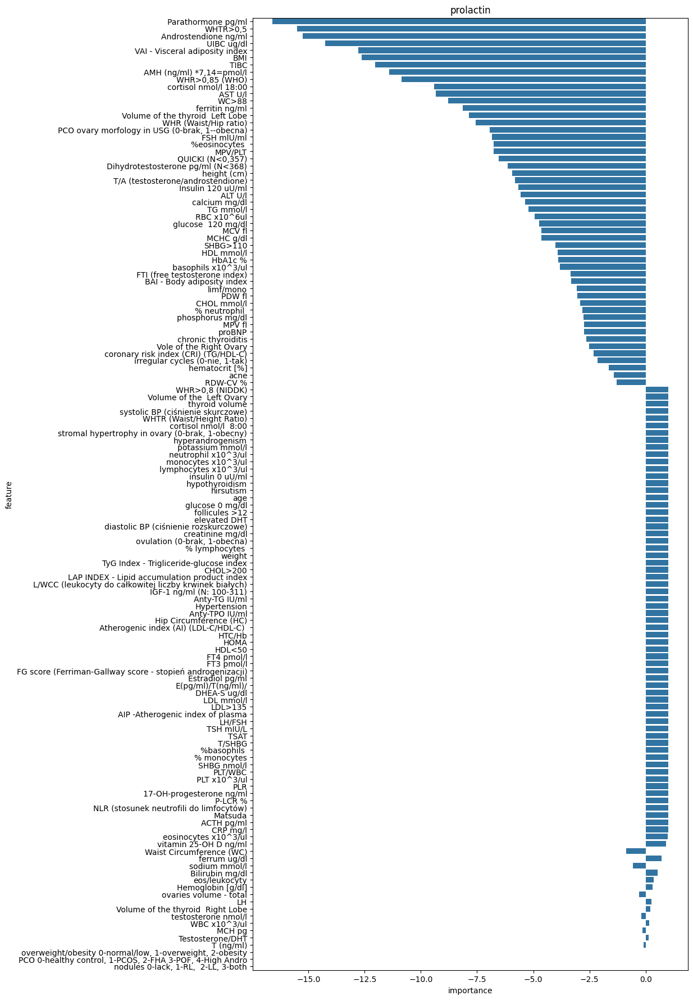

In [9]:
feature_importnces_ridge


plt.figure(figsize=(10, 22))
sns.barplot(feature_importnces_ridge, x="importance", y="feature").set(title=PROLACTIN)
plt.show()


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


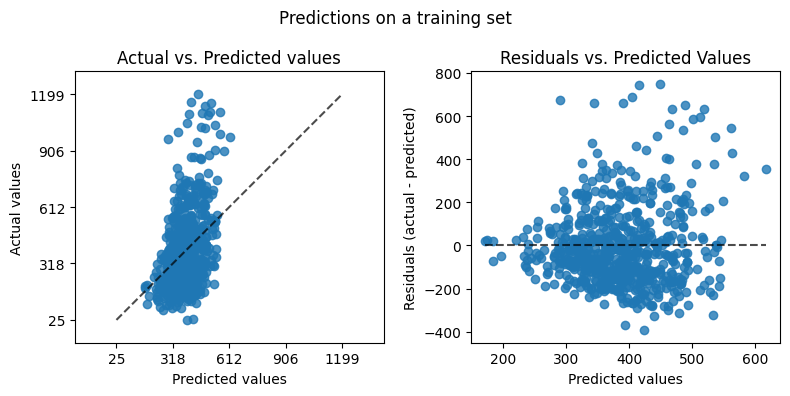

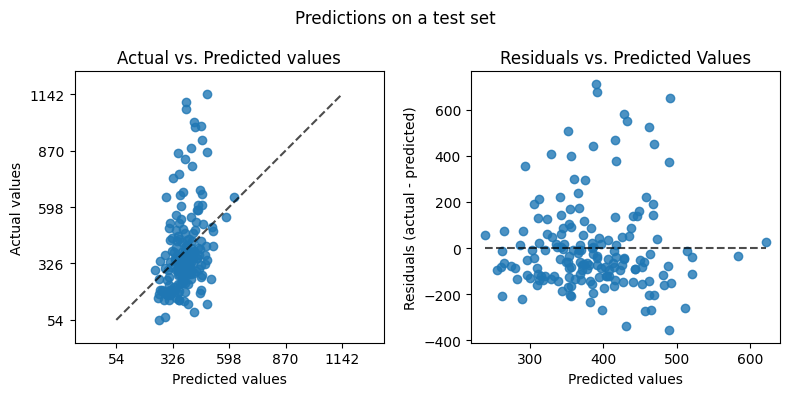

,model,data_set,mse,mae,rmse,r2
0,KNeighborsRegressor(n_neighbors=12),training,32521.546,136.191,180.337,0.172
1,KNeighborsRegressor(n_neighbors=12),test,38368.150,140.454,195.878,0.122


In [11]:
knn_model = KNeighborsRegressor(n_neighbors=12)

vit_d_model_scores_df, feature_importnces_knn = train_model(knn_model, PROLACTIN, X_train_prolactin, y_train_prolactin, X_test_prolactin, y_test_prolactin, continuous_preprocessor, categorical_preprocessor, get_feature_importance_knn)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


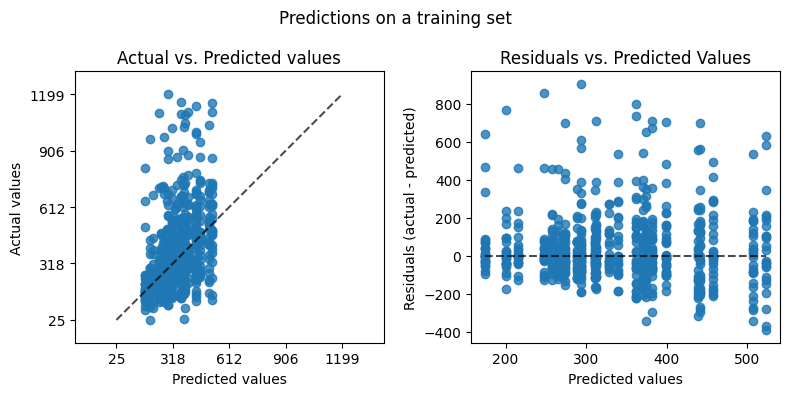

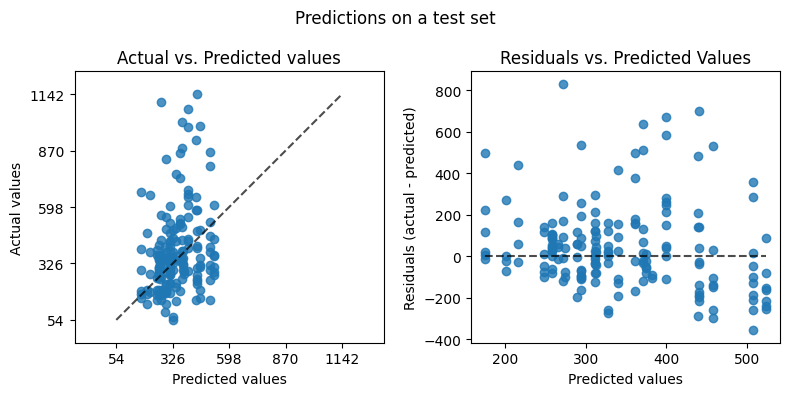

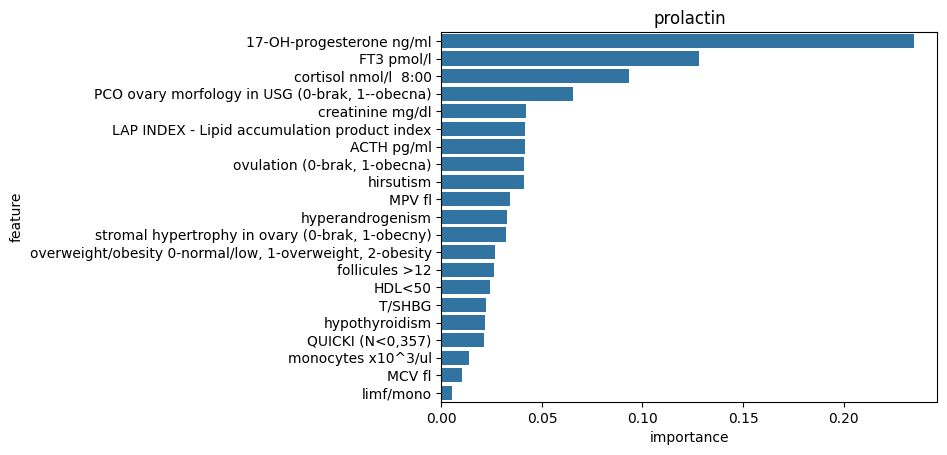

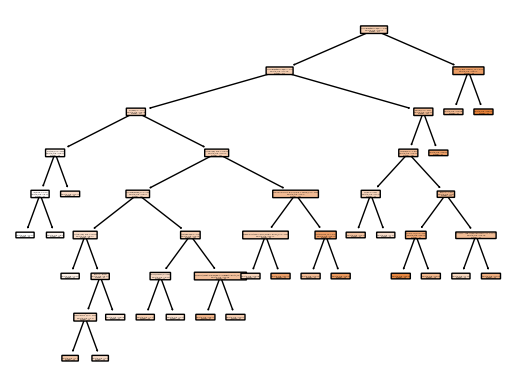

,model,data_set,mse,mae,rmse,r2
0,"DecisionTreeRegressor(criterion='absolute_error', max_depth=15,\n min_samples_leaf=20, min_samples_split=15,\n random_state=54, splitter='random')",training,33869.115,120.254,184.036,0.138
1,"DecisionTreeRegressor(criterion='absolute_error', max_depth=15,\n min_samples_leaf=20, min_samples_split=15,\n random_state=54, splitter='random')",test,44268.750,148.015,210.401,-0.013


In [9]:
tree_model = DecisionTreeRegressor(criterion="absolute_error", max_depth=15, min_samples_leaf=10, min_samples_split=20, splitter='random', random_state=54)
vit_d_model_scores_df, feature_importnces_tree = train_model(tree_model, PROLACTIN, X_train_prolactin, y_train_prolactin, X_test_prolactin, y_test_prolactin, continuous_preprocessor_tree, categorical_preprocessor, get_feature_importance_tree)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


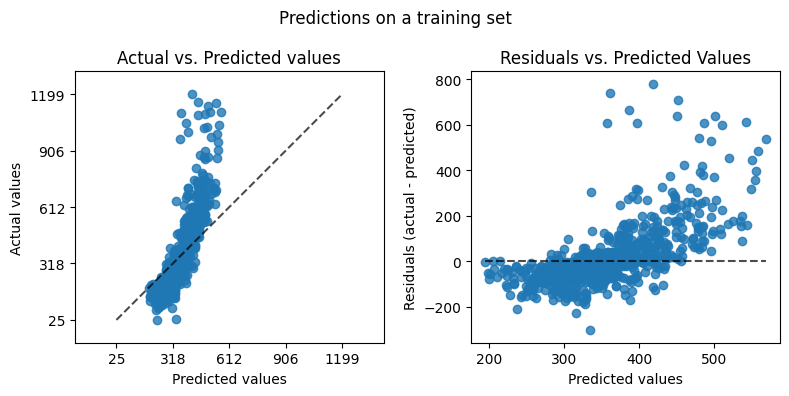

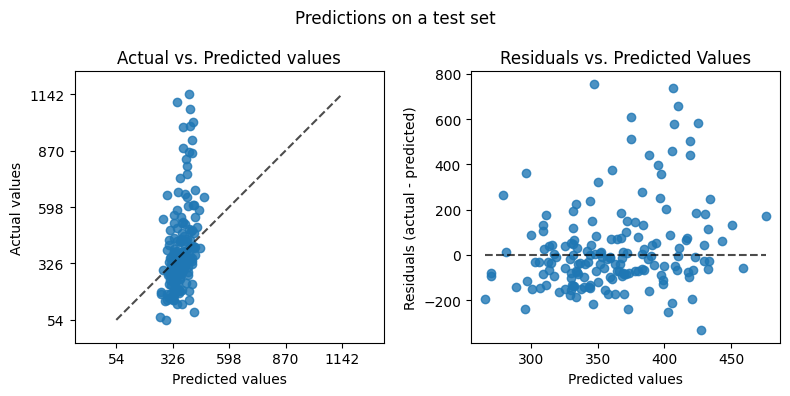

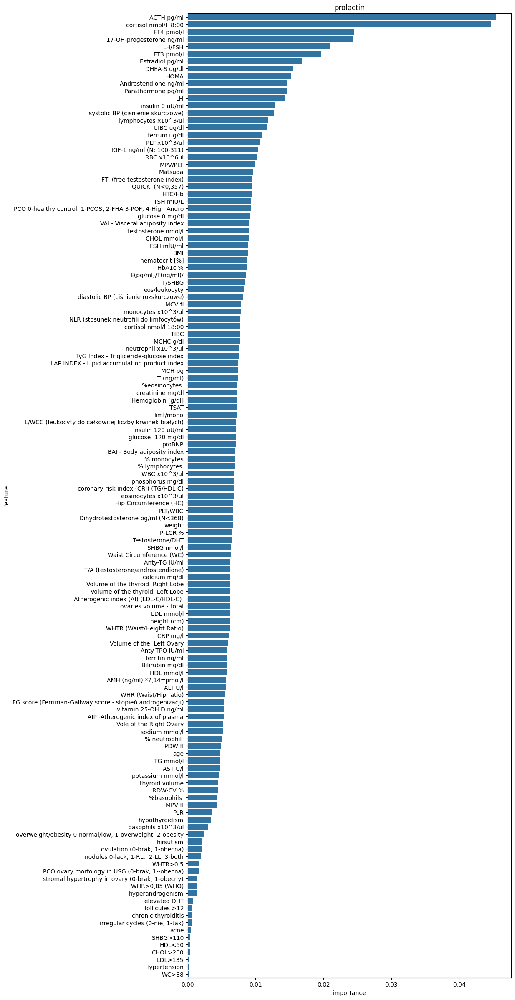

,model,data_set,mse,mae,rmse,r2
0,"RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n min_samples_leaf=5, min_samples_split=10,\n random_state=77)",training,20938.239,94.244,144.701,0.467
1,"RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n min_samples_leaf=5, min_samples_split=10,\n random_state=77)",test,38573.490,134.575,196.401,0.117


In [12]:
rf_model = RandomForestRegressor(n_estimators=100, max_depth=None, max_features='sqrt', min_samples_leaf=5, min_samples_split=10, criterion='absolute_error', random_state=77)
vit_d_model_scores_df, feature_importnces_rf = train_model(rf_model, PROLACTIN, X_train_prolactin, y_train_prolactin, X_test_prolactin, y_test_prolactin, continuous_preprocessor_tree, categorical_preprocessor, get_feature_importance_rf)
vit_d_model_scores_df

## Best models on subsets of data

In [10]:
def difference_of_sets(set1, set2):
    return set(set1) - set(set2)

featureset_variations = {}

# without the obviously related features
cropped_featureset = list(difference_of_sets(X_prolactin.columns, prolactin_associated_features))
featureset_variations['cropped'] = cropped_featureset

#  inflammatory attributes
inflammatory_featureset = difference_of_sets(inflammatory_attributes, prolactin_associated_features)
# featureset_variations['inflammatory'] = inflammatory_featureset


In [ ]:
from sklearn.svm import SVR

# Definicja modelu SVR z jądrem rbf
svr_model = SVR(kernel='rbf')

# Definicja siatki parametrów
svr_param_grid = {
    'model__C': [0.1, 1, 10, 100],  # Parametr regularizacji
    'model__gamma': [0.001, 0.01, 0.1, 1],  # Współczynnik gamma w funkcji jądra rbf
    'model__epsilon': [0.01, 0.1, 0.2, 0.5]  # Szerokość rury epsilon
}

# Przeprowadzenie strojenia hiperparametrów
svr_hyperparam_tuning_df = hyperparameter_tuning_general(X_train_prolactin[inflammatory_attributes], y_train_prolactin, PROLACTIN, svr_model, continuous_preprocessor, categorical_preprocessor, svr_param_grid)

# Sortowanie wyników według mean_test_score
svr_hyperparam_tuning_df.sort_values(by='mean_test_score').head()

Featureset: cropped
Model: LinearRegression


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


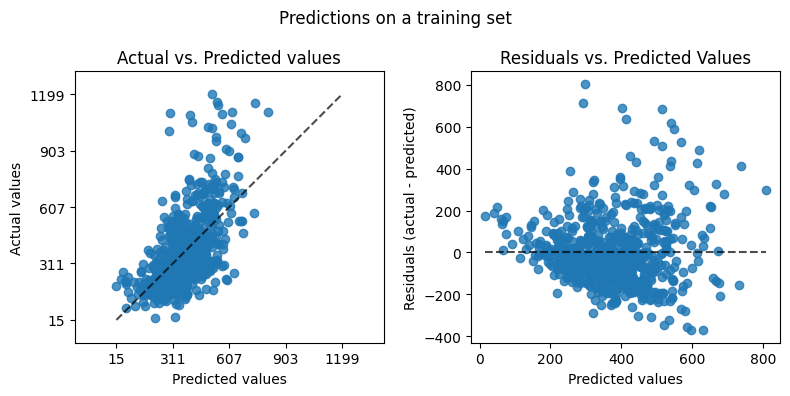

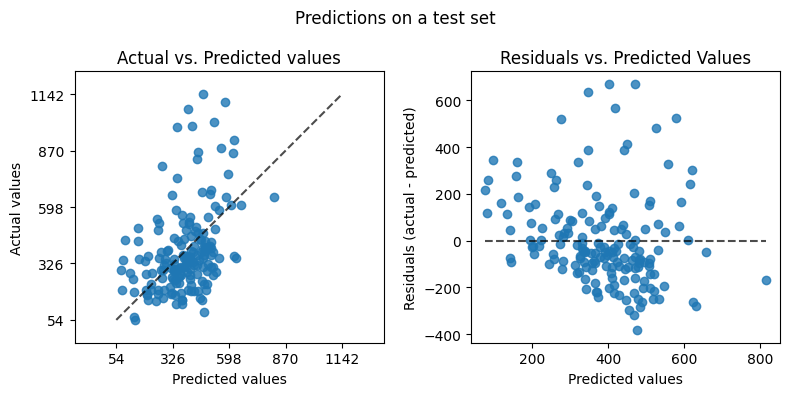

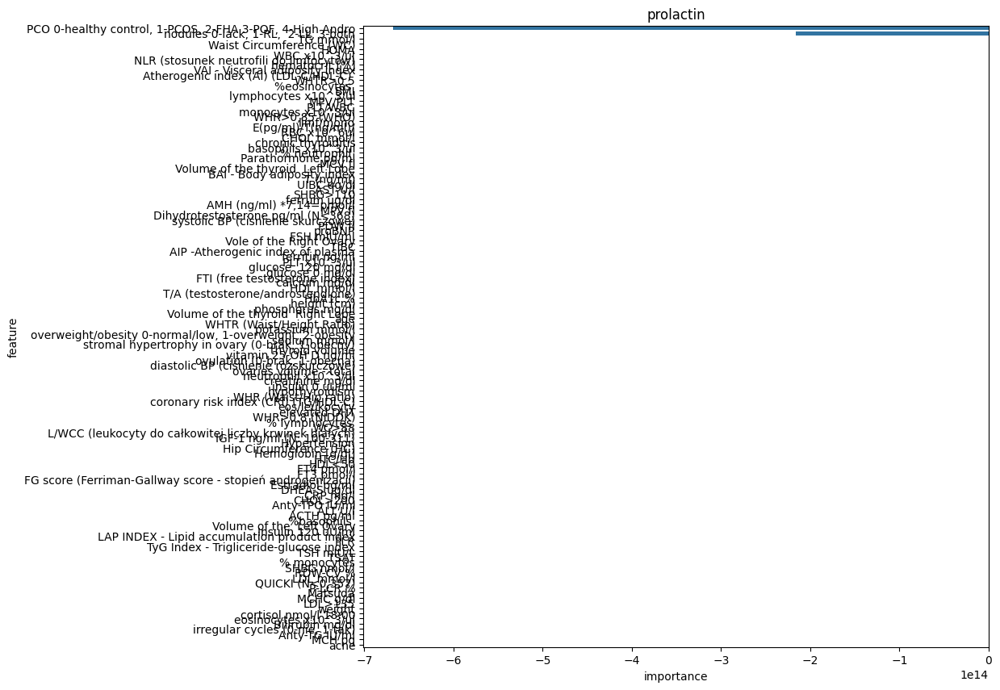

                model  data_set        mse      mae     rmse     r2
0  LinearRegression()  training  25230.409  117.466  158.841  0.358
1  LinearRegression()      test  38737.567  147.350  196.819  0.113

Model: Lasso


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


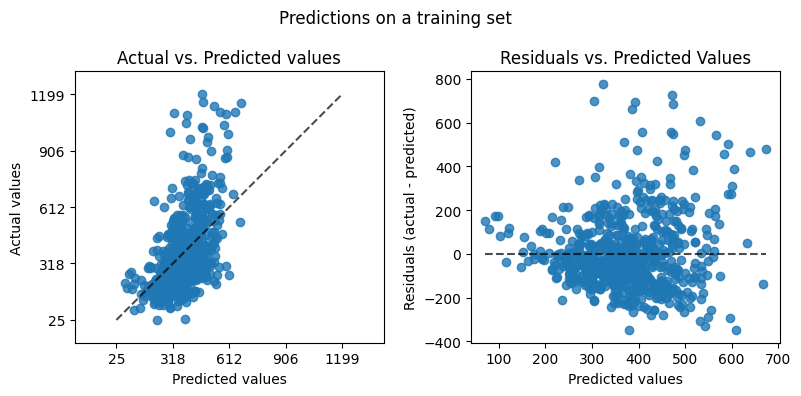

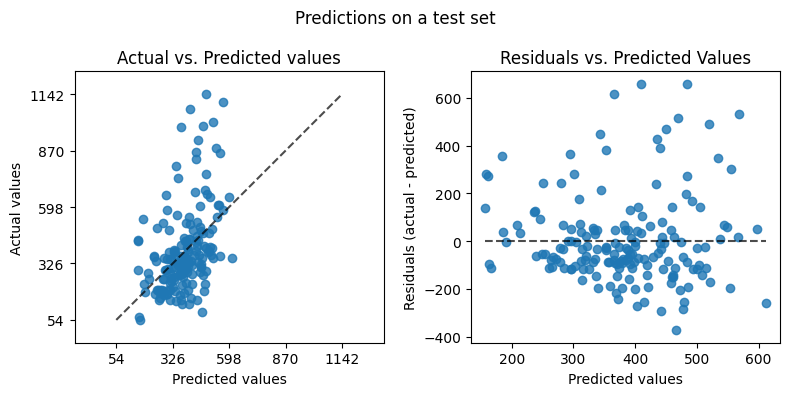

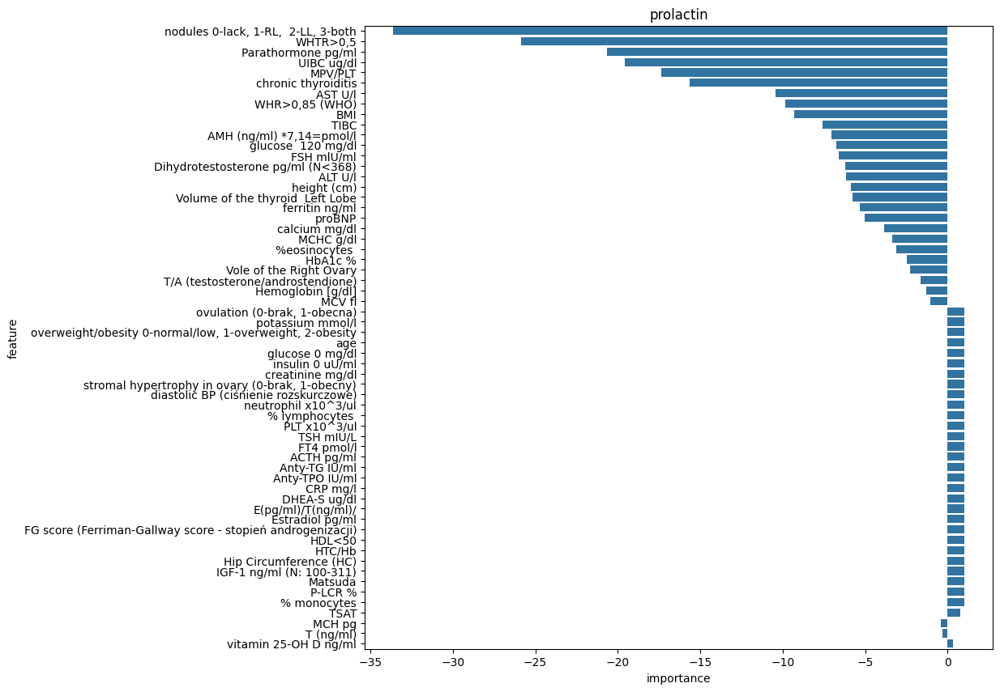

            model  data_set        mse      mae     rmse     r2
0  Lasso(alpha=2)  training  28135.522  124.085  167.736  0.284
1  Lasso(alpha=2)      test  35256.743  135.006  187.768  0.193

Model: Ridge


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


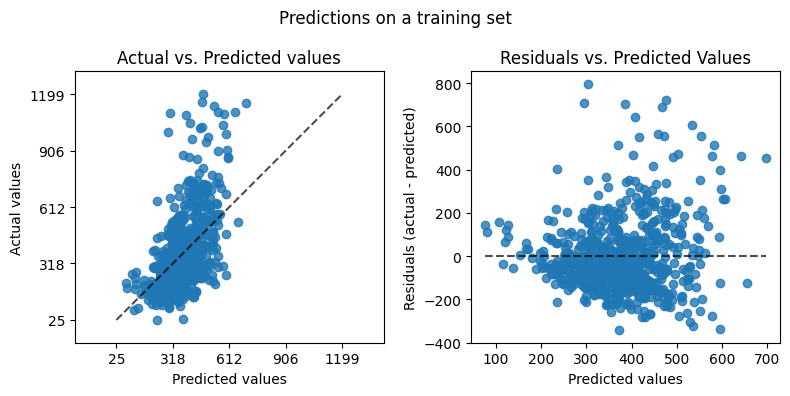

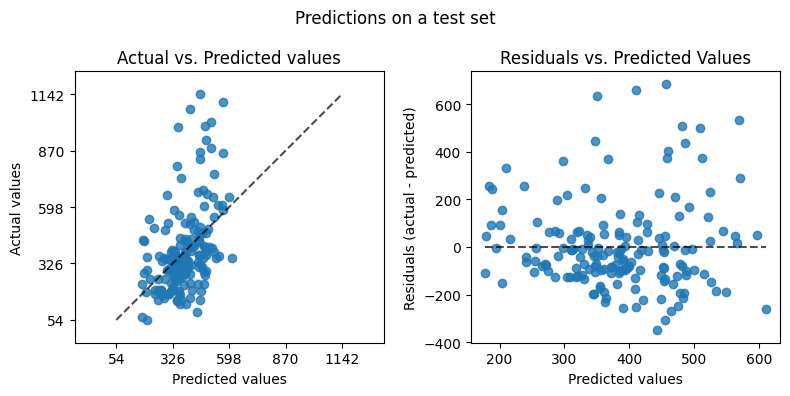

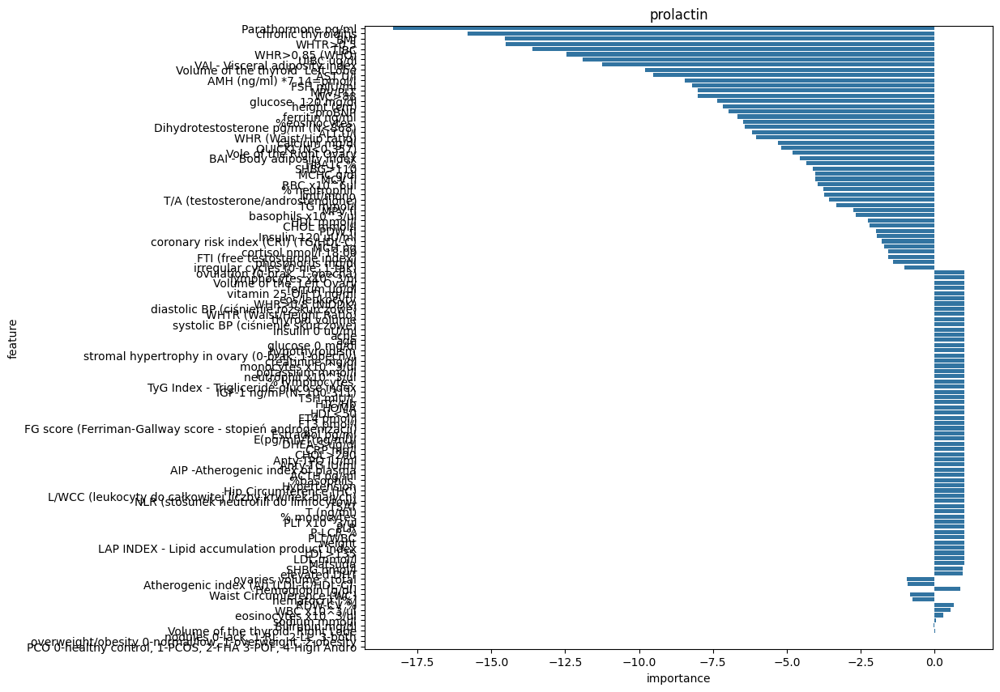

              model  data_set        mse      mae     rmse     r2
0  Ridge(alpha=100)  training  27719.745  123.371  166.492  0.294
1  Ridge(alpha=100)      test  34908.886  134.633  186.839  0.201

Model: DecisionTree


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


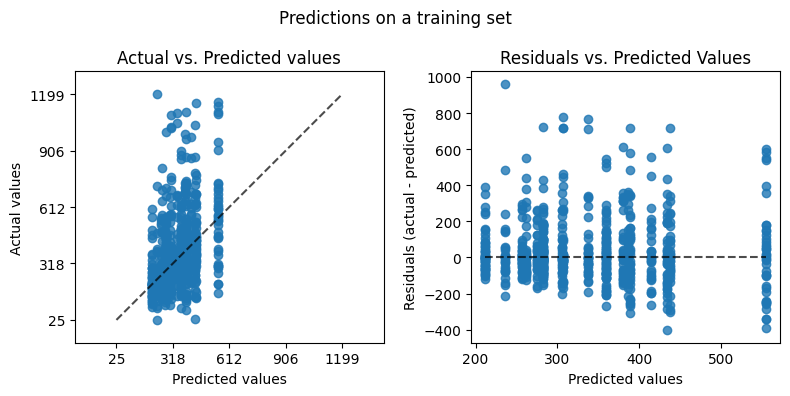

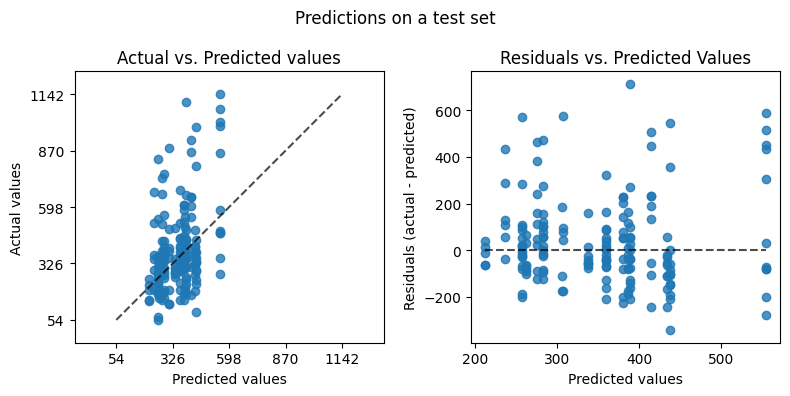

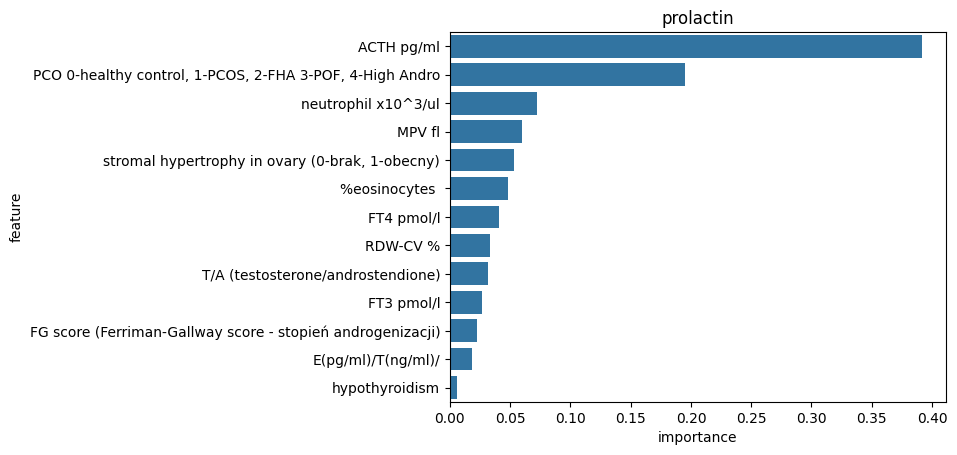

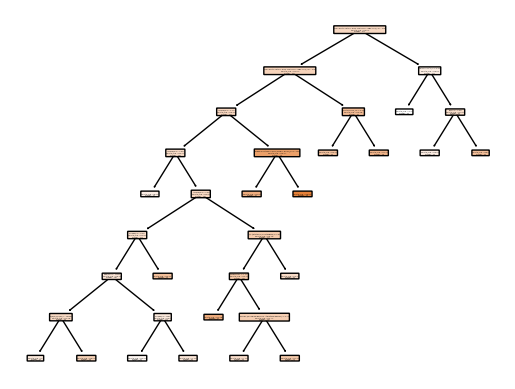

                                                                                                                                                                                         model  data_set        mse      mae     rmse     r2
0  DecisionTreeRegressor(criterion='absolute_error', max_depth=8,\n                      min_samples_leaf=27, min_samples_split=17,\n                      random_state=62, splitter='random')  training  34367.186  123.914  185.384  0.125
1  DecisionTreeRegressor(criterion='absolute_error', max_depth=8,\n                      min_samples_leaf=27, min_samples_split=17,\n                      random_state=62, splitter='random')      test  37812.857  137.796  194.455  0.135

Model: RandomForest


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


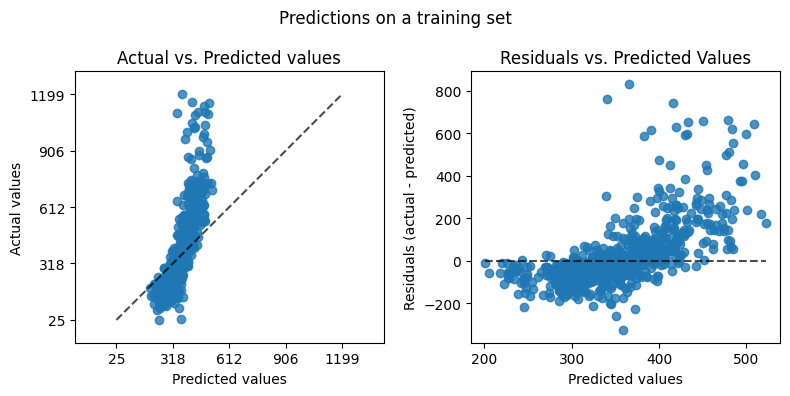

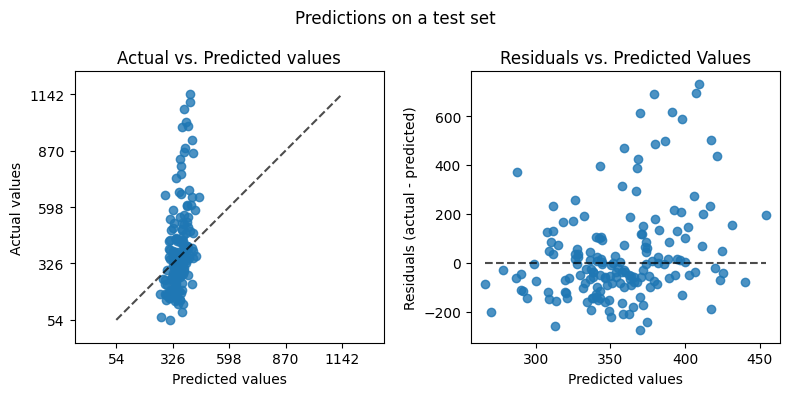

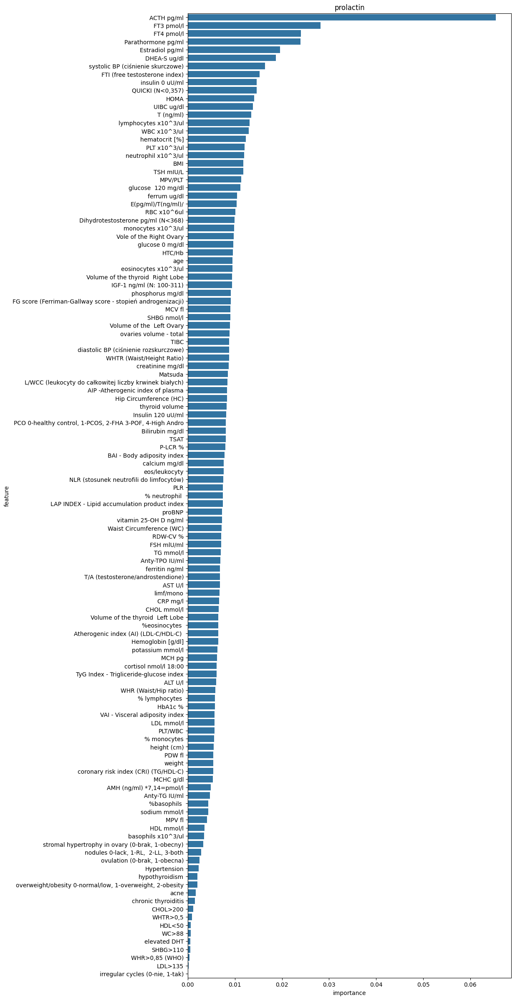

                                                                                                                                                                                               model  data_set        mse      mae     rmse     r2
0  RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n                      min_samples_leaf=7, min_samples_split=10,\n                      n_estimators=200, random_state=56)  training  24154.672  102.746  155.418  0.385
1  RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n                      min_samples_leaf=7, min_samples_split=10,\n                      n_estimators=200, random_state=56)      test  39127.939  135.337  197.808  0.105

Model: KNN


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


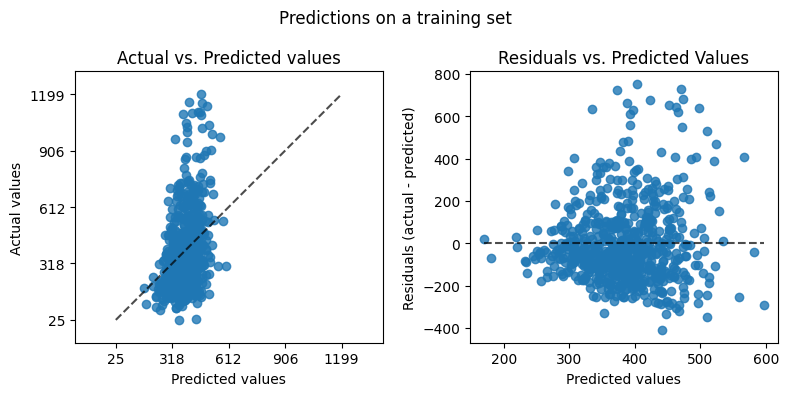

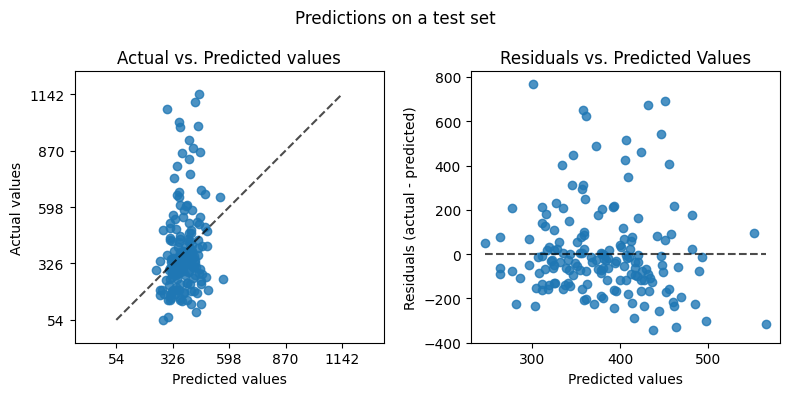

                                 model  data_set        mse      mae     rmse     r2
0  KNeighborsRegressor(n_neighbors=14)  training  34050.889  139.017  184.529  0.133
1  KNeighborsRegressor(n_neighbors=14)      test  42441.601  145.945  206.014  0.029



In [16]:
models = {
    'LinearRegression': (LinearRegression(), get_feature_importance_lasso, continuous_preprocessor),
    'Lasso': (Lasso(alpha=2), get_feature_importance_lasso, continuous_preprocessor),
    'Ridge': (Ridge(alpha=100), get_feature_importance_lasso, continuous_preprocessor),
    'DecisionTree': (DecisionTreeRegressor(criterion="absolute_error", max_depth=8, min_samples_leaf=27, min_samples_split=17, splitter='random', random_state=62), get_feature_importance_tree, continuous_preprocessor_tree),
    'RandomForest': (RandomForestRegressor(n_estimators=200, max_depth=None, max_features='sqrt', min_samples_leaf=7, min_samples_split=10, criterion='absolute_error', random_state=56), get_feature_importance_rf, continuous_preprocessor_tree),
    'KNN': (KNeighborsRegressor(n_neighbors=14), get_feature_importance_knn, continuous_preprocessor),
    # 'SVR': (SVR(kernel='rbf', C=100, gamma=0.01, epsilon=0.5), get_feature_importance_knn, continuous_preprocessor),


}


for featureset_name, featureset in featureset_variations.items():
    print(f"Featureset: {featureset_name}")
    X_featureset = X_prolactin[list(featureset)]
    X_train_featureset, X_test_featureset, y_train_featureset, y_test_featureset = train_test_split(X_featureset, y_prolactin, test_size=0.2, random_state=42)

    for model_name, (model, feature_importance_method, cont_preprocessor) in models.items():
        print(f"Model: {model_name}")
        # for continuous_preprocessor in [tree_continuous_preprocessing, continuous_preprocessor, linear_continuous_preprocessor]:
        #     print(f"Continuous preprocessor: {continuous_preprocessor}")
        model_scores_df, feature_importances = train_model(model, PROLACTIN, X_train_featureset, y_train_featureset, X_test_featureset, y_test_featureset, cont_preprocessor, categorical_preprocessor, feature_importance_method)
        print(model_scores_df)
        print()


## Feature importances

In [11]:
selected_features_map = {}

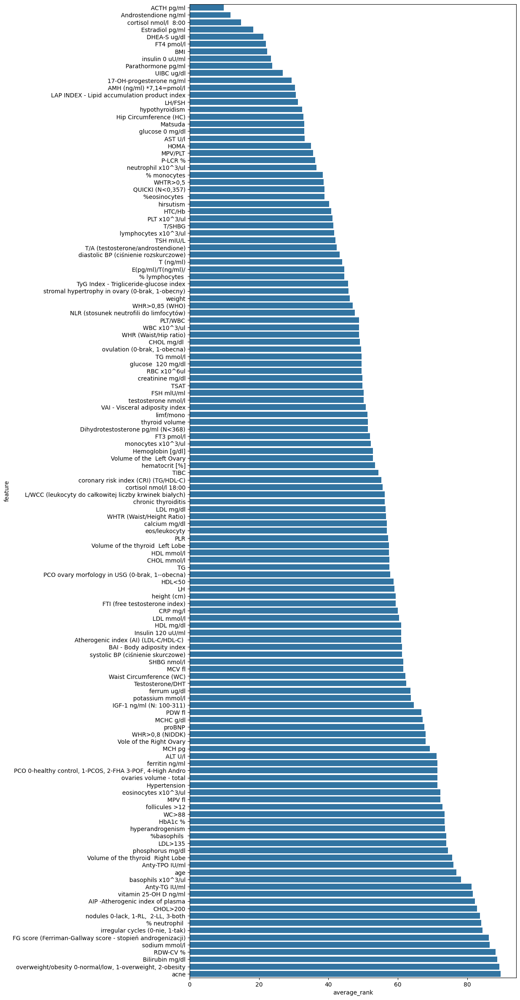

In [18]:
rename_importnace_col(feature_importnces_lr, 'linear_regression')
rename_importnace_col(feature_importnces_lasso, 'lasso')
rename_importnace_col(feature_importnces_ridge, 'ridge')
rename_importnace_col(feature_importnces_tree, 'tree')
rename_importnace_col(feature_importnces_rf, 'rf')

feature_importance_df = merge_feature_importances([feature_importnces_lr, feature_importnces_lasso, feature_importnces_ridge, feature_importnces_tree, feature_importnces_rf])

ranked_df = rank_importances(feature_importance_df)
ranked_df_sorted = ranked_df.sort_values(by='average_rank')

plt.figure(figsize=(10, 30))
sns.barplot(ranked_df_sorted, x="average_rank", y="feature")
plt.show()

In [20]:
overall_rank_top_features = ranked_df_sorted[ranked_df_sorted['average_rank'] < 50] # a cut found on the plot above
overall_rank_selected_features = list(overall_rank_top_features['feature'].values)

selected_features_map['average_rank'] = overall_rank_selected_features
print(f'Top {len(overall_rank_selected_features)} features:')
overall_rank_selected_features

Top 53 features:


['ACTH pg/ml',
 'Androstendione ng/ml',
 'cortisol nmol/l  8:00',
 'Estradiol pg/ml',
 'DHEA-S ug/dl',
 'FT4 pmol/l',
 'BMI',
 'insulin 0 uU/ml',
 'Parathormone pg/ml',
 'UIBC ug/dl',
 '17-OH-progesterone ng/ml',
 'AMH (ng/ml) *7,14=pmol/l',
 'LAP INDEX - Lipid accumulation product index',
 'LH/FSH',
 'hypothyroidism',
 'Hip Circumference (HC)',
 'Matsuda',
 'glucose 0 mg/dl',
 'AST U/l',
 'HOMA',
 'MPV/PLT',
 'P-LCR %',
 'neutrophil x10^3/ul',
 '% monocytes',
 'WHTR>0,5',
 'QUICKI (N<0,357)',
 '%eosinocytes ',
 'hirsutism',
 'HTC/Hb',
 'PLT x10^3/ul',
 'T/SHBG',
 'lymphocytes x10^3/ul',
 'TSH mIU/L',
 'T/A (testosterone/androstendione)',
 'diastolic BP (ciśnienie rozskurczowe)',
 'T (ng/ml)',
 'E(pg/ml)/T(ng/ml)/',
 '% lymphocytes ',
 'TyG Index - Trigliceride-glucose index',
 'stromal hypertrophy in ovary (0-brak, 1-obecny)',
 'weight',
 'WHR>0,85 (WHO)',
 'NLR (stosunek neutrofili do limfocytów)',
 'PLT/WBC',
 'WBC x10^3/ul',
 'WHR (Waist/Hip ratio)',
 'CHOL mg/dl ',
 'ovulation (0-

## Feature selection methods

### Mutual info

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


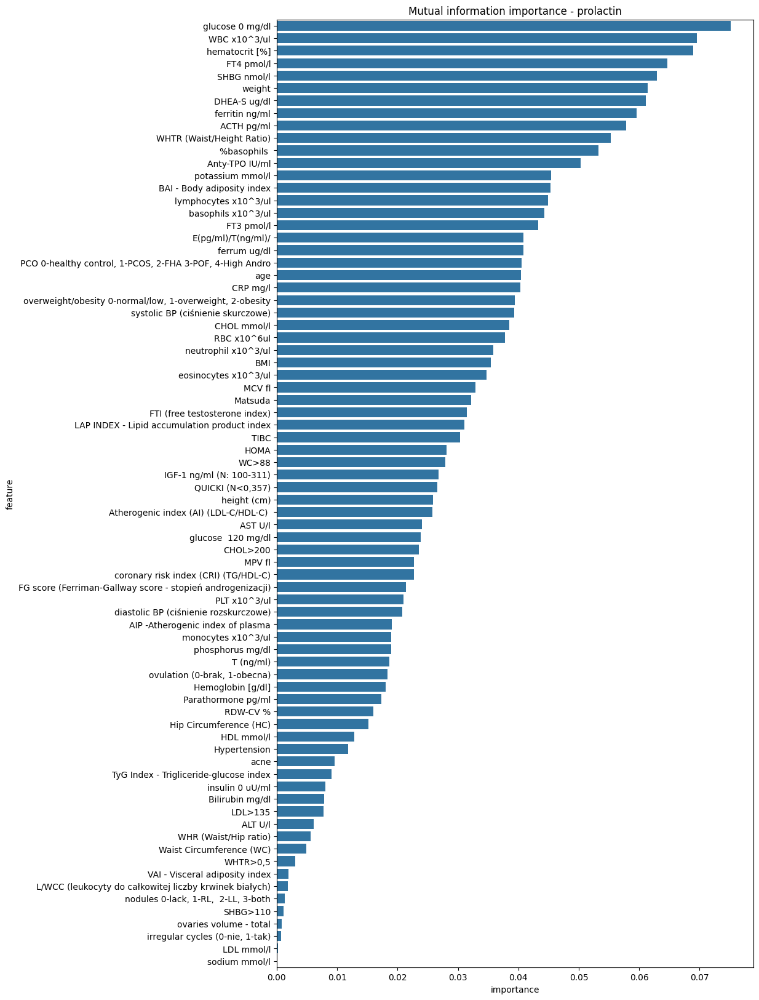

Selected 76 features


In [12]:
#  NOTE: cropped featureset
selected_feature_names_mutual_info = feature_selection_mutual_info_regression(X_train_prolactin[cropped_featureset], y_train_prolactin, PROLACTIN, continuous_preprocessor, categorical_preprocessor, figsize=(10,20))
selected_feature_names_mutual_info = selected_feature_names_mutual_info[selected_feature_names_mutual_info['importance'] > 0]

selected_feature_names_mutual_info.reset_index(drop=True, inplace=True)
print(f'Selected {len(selected_feature_names_mutual_info)} features')
selected_features_map['mutual_info'] = list(selected_feature_names_mutual_info['feature'].values)
# selected_feature_names_mutual_info

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


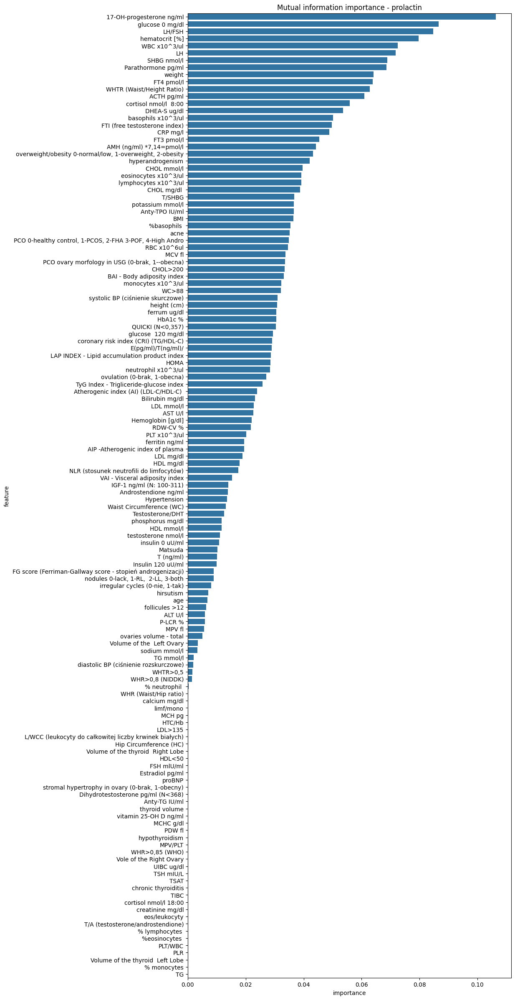

Selected 96 features


In [20]:
selected_feature_names_mutual_info = feature_selection_mutual_info_regression(X_train_prolactin, y_train_prolactin, PROLACTIN, continuous_preprocessor, categorical_preprocessor)
selected_feature_names_mutual_info = selected_feature_names_mutual_info[selected_feature_names_mutual_info['importance'] > 0]

selected_feature_names_mutual_info.reset_index(drop=True, inplace=True)
print(f'Selected {len(selected_feature_names_mutual_info)} features')
selected_features_map['mutual_info'] = list(selected_feature_names_mutual_info['feature'].values)
# selected_feature_names_mutual_info

### Recursive feature elimination

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


Optimal number of features: 37


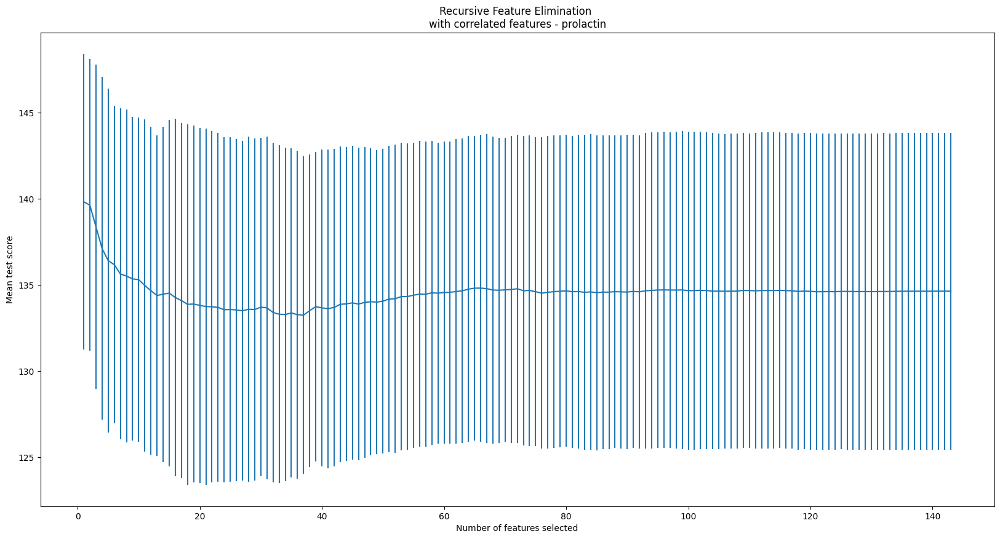

['UIBC ug/dl',
 'Estradiol pg/ml',
 'FT4 pmol/l',
 'Parathormone pg/ml',
 'HDL<50',
 'HTC/Hb',
 'insulin 0 uU/ml',
 'Hip Circumference (HC)',
 'DHEA-S ug/dl',
 'TSH mIU/L',
 'chronic thyroiditis',
 'hirsutism',
 'glucose 0 mg/dl',
 'MPV/PLT',
 'Matsuda',
 'P-LCR %',
 'PLT/WBC',
 'hypothyroidism',
 'cortisol nmol/l 18:00',
 'QUICKI (N<0,357)',
 'cortisol nmol/l  8:00',
 'AST U/l',
 'Androstendione ng/ml',
 'neutrophil x10^3/ul',
 'WHR>0,85 (WHO)',
 'ovulation (0-brak, 1-obecna)',
 'AMH (ng/ml) *7,14=pmol/l',
 'ACTH pg/ml',
 'WHTR>0,5',
 'WC>88',
 'stromal hypertrophy in ovary (0-brak, 1-obecny)',
 '% lymphocytes ',
 'nodules 0-lack, 1-RL,  2-LL, 3-both',
 '17-OH-progesterone ng/ml',
 '% monocytes']

In [23]:
# lasso_model = Lasso(alpha=1)
lasso_model = Ridge(alpha=100)

recursive_feature_elimination_ranked_features_lasso = recursive_feature_elimination(X_train_prolactin, y_train_prolactin, lasso_model, PROLACTIN, continuous_preprocessor, categorical_preprocessor)
selected_features_map['recursive_feature_elimination'] = list(recursive_feature_elimination_ranked_features_lasso[recursive_feature_elimination_ranked_features_lasso['ranking'] == 1]['feature'].values)
selected_features_map['recursive_feature_elimination']

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


Optimal number of features: 28


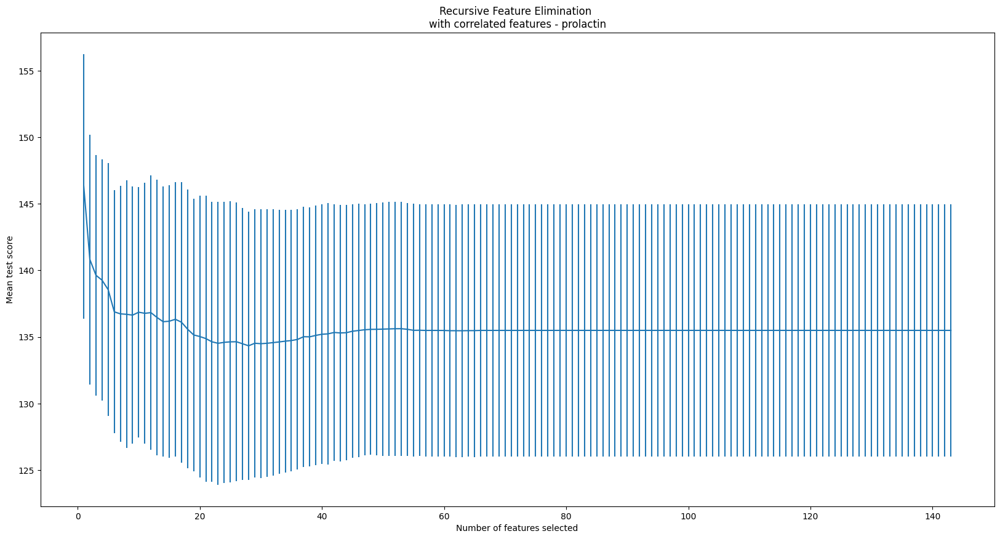

['P-LCR %',
 'FT4 pmol/l',
 'HTC/Hb',
 'UIBC ug/dl',
 'WHTR>0,5',
 'Estradiol pg/ml',
 'Parathormone pg/ml',
 'Hip Circumference (HC)',
 'DHEA-S ug/dl',
 'ovulation (0-brak, 1-obecna)',
 'Insulin 120 uU/ml',
 'insulin 0 uU/ml',
 'stromal hypertrophy in ovary (0-brak, 1-obecny)',
 'TSH mIU/L',
 'hirsutism',
 'WHR>0,85 (WHO)',
 'hypothyroidism',
 'chronic thyroiditis',
 'Androstendione ng/ml',
 'AST U/l',
 'AMH (ng/ml) *7,14=pmol/l',
 'nodules 0-lack, 1-RL,  2-LL, 3-both',
 'cortisol nmol/l  8:00',
 'ACTH pg/ml',
 '17-OH-progesterone ng/ml',
 '% monocytes',
 'glucose 0 mg/dl',
 'PLT x10^3/ul']

In [24]:
lasso_model = Lasso(alpha=2)
# lasso_model = Ridge(alpha=50)

recursive_feature_elimination_ranked_features_lasso = recursive_feature_elimination(X_train_prolactin, y_train_prolactin, lasso_model, PROLACTIN, continuous_preprocessor, categorical_preprocessor)
selected_features_map['recursive_feature_elimination'] = list(recursive_feature_elimination_ranked_features_lasso[recursive_feature_elimination_ranked_features_lasso['ranking'] == 1]['feature'].values)
selected_features_map['recursive_feature_elimination']

### Permutation importance

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


selected 120 features


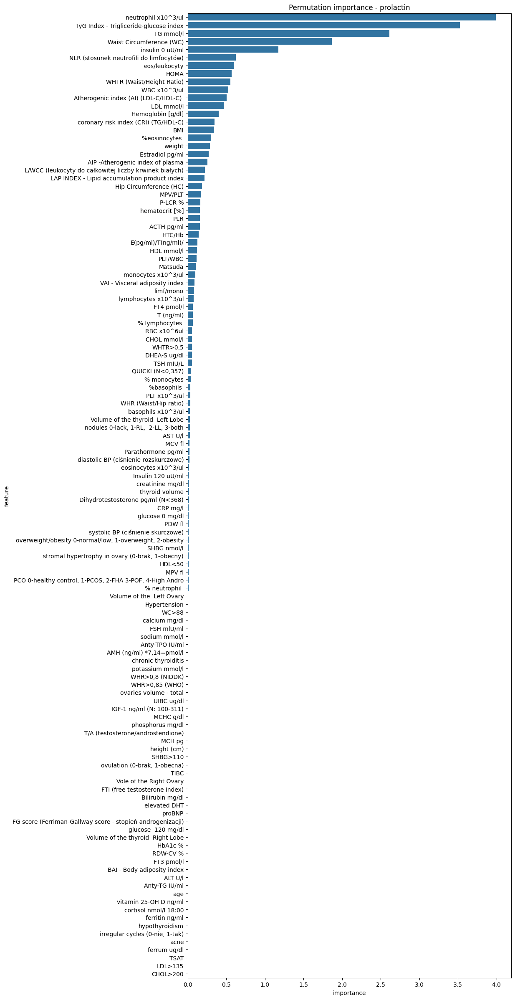

Actually selected 94 features


In [14]:
#  cropped featureset
lasso_model = LinearRegression()

selected_features_permutation_importance = get_permutation_importance(X_train_prolactin[cropped_featureset], y_train_prolactin, lasso_model, continuous_preprocessor_hyperparam_tuning, categorical_preprocessor, PROLACTIN)
selected_features_permutation_importance = selected_features_permutation_importance[selected_features_permutation_importance['importance'] > 0.005]
selected_features_map['permutation_importance'] = list(selected_features_permutation_importance['feature'].values)
print(f'Actually selected {len(selected_features_map['permutation_importance'])} features')
# selected_features_permutation_importance

In [16]:
selected_features_permutation_importance = selected_features_permutation_importance[selected_features_permutation_importance['importance'] > 0.02]
selected_features_map['permutation_importance'] = list(selected_features_permutation_importance['feature'].values)

In [17]:
len(selected_features_map['permutation_importance'])

56

In [18]:
len(selected_features_map['mutual_info'])

76

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


selected 132 features


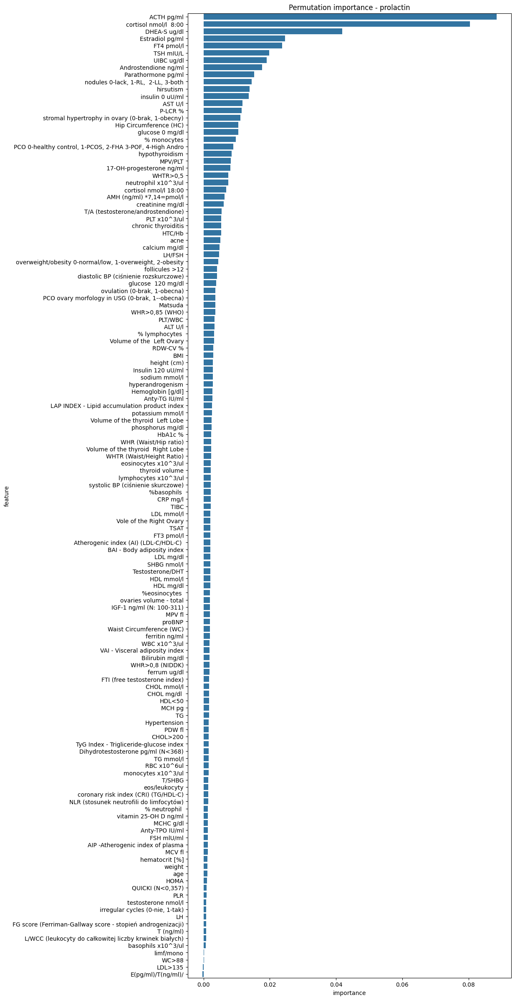

Actually selected 32 features


In [21]:
lasso_model = Lasso(alpha=2)

selected_features_permutation_importance = get_permutation_importance(X_train_prolactin, y_train_prolactin, lasso_model, continuous_preprocessor, categorical_preprocessor, PROLACTIN)
selected_features_permutation_importance = selected_features_permutation_importance[selected_features_permutation_importance['importance'] > 0.005]
selected_features_map['permutation_importance'] = list(selected_features_permutation_importance['feature'].values)
print(f'Actually selected {len(selected_features_map['permutation_importance'])} features')
# selected_features_permutation_importance

In [19]:
#  only mutual info & permutation importance
intersection_all_sets = set(selected_features_map[next(iter(selected_features_map))])

for key, items in selected_features_map.items():
    intersection_all_sets.intersection_update(items)


intersection_all_sets = list(intersection_all_sets)
print(len(intersection_all_sets))
print(intersection_all_sets)

pd.DataFrame(intersection_all_sets)

41
['AST U/l', 'insulin 0 uU/ml', 'weight', 'VAI - Visceral adiposity index', 'Parathormone pg/ml', 'diastolic BP (ciśnienie rozskurczowe)', 'L/WCC (leukocyty do całkowitej liczby krwinek białych)', 'basophils x10^3/ul', 'RBC x10^6ul', 'coronary risk index (CRI) (TG/HDL-C)', 'WHR (Waist/Hip ratio)', 'MCV fl', 'DHEA-S ug/dl', 'WHTR>0,5', 'Atherogenic index (AI) (LDL-C/HDL-C) ', 'LDL mmol/l', 'LAP INDEX - Lipid accumulation product index', 'hematocrit [%]', 'CHOL mmol/l', 'QUICKI (N<0,357)', 'Matsuda', 'TyG Index - Trigliceride-glucose index', 'T (ng/ml)', 'BMI', 'ACTH pg/ml', 'FT4 pmol/l', 'WHTR (Waist/Height Ratio)', 'neutrophil x10^3/ul', 'monocytes x10^3/ul', 'Hip Circumference (HC)', 'HOMA', 'E(pg/ml)/T(ng/ml)/', 'lymphocytes x10^3/ul', 'AIP -Atherogenic index of plasma', 'HDL mmol/l', 'PLT x10^3/ul', 'Waist Circumference (WC)', '%basophils ', 'WBC x10^3/ul', 'Hemoglobin [g/dl]', 'nodules 0-lack, 1-RL,  2-LL, 3-both']


,0
0,AST U/l
1,insulin 0 uU/ml
2,weight
3,VAI - Visceral adiposity index
4,Parathormone pg/ml
5,diastolic BP (ciśnienie rozskurczowe)
6,L/WCC (leukocyty do całkowitej liczby krwinek białych)
7,basophils x10^3/ul
8,RBC x10^6ul
9,coronary risk index (CRI) (TG/HDL-C)


In [22]:
intersection_all_sets = set(selected_features_map[next(iter(selected_features_map))])

for key, items in selected_features_map.items():
    intersection_all_sets.intersection_update(items)


intersection_all_sets = list(intersection_all_sets)
print(len(intersection_all_sets))
print(intersection_all_sets)

pd.DataFrame(intersection_all_sets)

19
['Parathormone pg/ml', 'AMH (ng/ml) *7,14=pmol/l', 'hirsutism', 'nodules 0-lack, 1-RL,  2-LL, 3-both', 'ACTH pg/ml', 'PLT x10^3/ul', 'DHEA-S ug/dl', 'FT4 pmol/l', 'cortisol nmol/l  8:00', 'AST U/l', 'Androstendione ng/ml', 'insulin 0 uU/ml', 'neutrophil x10^3/ul', 'PCO 0-healthy control, 1-PCOS, 2-FHA 3-POF, 4-High Andro', 'glucose 0 mg/dl', 'acne', '17-OH-progesterone ng/ml', 'P-LCR %', 'WHTR>0,5']


,0
0,Parathormone pg/ml
1,"AMH (ng/ml) *7,14=pmol/l"
2,hirsutism
3,"nodules 0-lack, 1-RL, 2-LL, 3-both"
4,ACTH pg/ml
5,PLT x10^3/ul
6,DHEA-S ug/dl
7,FT4 pmol/l
8,cortisol nmol/l 8:00
9,AST U/l


In [29]:
intersection_all_sets = ['FT4 pmol/l',
'PLT x10^3/ul',
'hirsutism',
'17-OH-progesterone ng/ml',
'P-LCR %',
'AST U/l',
'glucose 0 mg/dl',
'AMH (ng/ml) *7,14=pmol/l',
'DHEA-S ug/dl',
'ACTH pg/ml',
'Androstendione ng/ml',
'WHTR>0,5',
'Parathormone pg/ml',
'insulin 0 uU/ml',
'cortisol nmol/l  8:00',
]

In [27]:
union_all_sets = set(selected_features_map[next(iter(selected_features_map))]) 

for key, items in selected_features_map.items():
    union_all_sets.update(items)
    

union_all_sets = list(union_all_sets)
print(len(union_all_sets))
print(union_all_sets)

107
['glucose  120 mg/dl', 'E(pg/ml)/T(ng/ml)/', ' HDL mg/dl', 'UIBC ug/dl', 'Volume of the  Left Ovary', 'hypothyroidism', 'LH', '17-OH-progesterone ng/ml', 'ferritin ng/ml', 'TSH mIU/L', 'T (ng/ml)', 'weight', 'MPV fl', 'testosterone nmol/l', 'LH/FSH', 'hirsutism', 'LDL mmol/l', 'neutrophil x10^3/ul', 'FT3 pmol/l', 'IGF-1 ng/ml (N: 100-311)', 'systolic BP (ciśnienie skurczowe)', 'WC>88', 'LAP INDEX - Lipid accumulation product index', 'BMI', 'monocytes x10^3/ul', 'eosinocytes x10^3/ul', 'WHR>0,8 (NIDDK)', 'age', 'Anty-TPO IU/ml', 'MPV/PLT', 'Hemoglobin [g/dl]', '%basophils ', '% lymphocytes ', '%eosinocytes ', 'height (cm)', 'BAI - Body adiposity index', 'ALT U/l', 'WHR (Waist/Hip ratio)', 'stromal hypertrophy in ovary (0-brak, 1-obecny)', 'diastolic BP (ciśnienie rozskurczowe)', 'RDW-CV %', 'LDL mg/dl', 'MCV fl', 'CHOL mg/dl ', 'Insulin 120 uU/ml', 'WHTR>0,5', 'Hypertension', 'nodules 0-lack, 1-RL,  2-LL, 3-both', 'HOMA', 'CHOL mmol/l', 'PLT x10^3/ul', 'T/SHBG', 'overweight/obesity 

## Test the narrowed down feature space

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


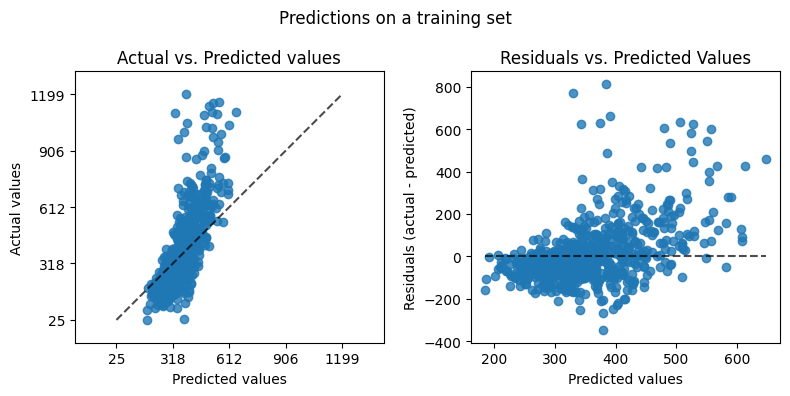

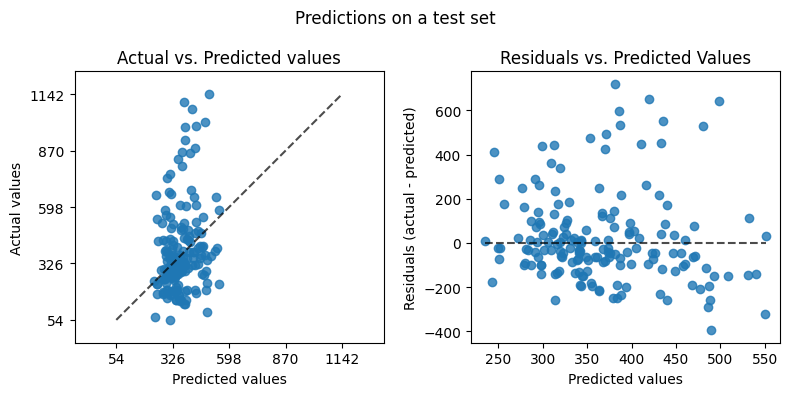

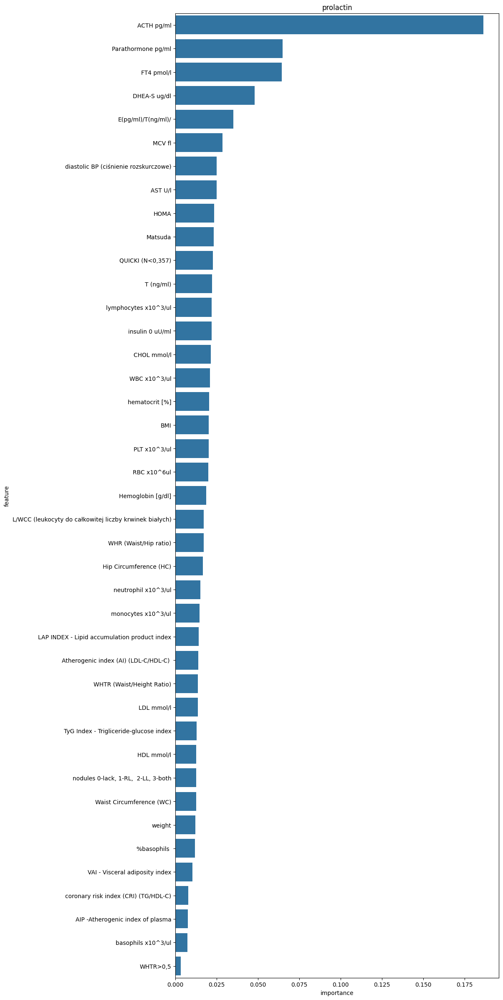

,model,data_set,mse,mae,rmse,r2
0,"RandomForestRegressor(criterion='absolute_error', min_samples_leaf=5,\n min_samples_split=5, random_state=77)",training,21426.693,96.837,146.379,0.455
1,"RandomForestRegressor(criterion='absolute_error', min_samples_leaf=5,\n min_samples_split=5, random_state=77)",test,42399.724,145.725,205.912,0.030


In [25]:
feature_subset = intersection_all_sets

lasso_model = RandomForestRegressor(n_estimators=100, max_depth=None, min_samples_leaf=5, min_samples_split=5, criterion='absolute_error', random_state=77)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, PROLACTIN, X_train_prolactin[feature_subset], y_train_prolactin, X_test_prolactin[feature_subset], y_test_prolactin, continuous_preprocessor, categorical_preprocessor, get_feature_importance_rf)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


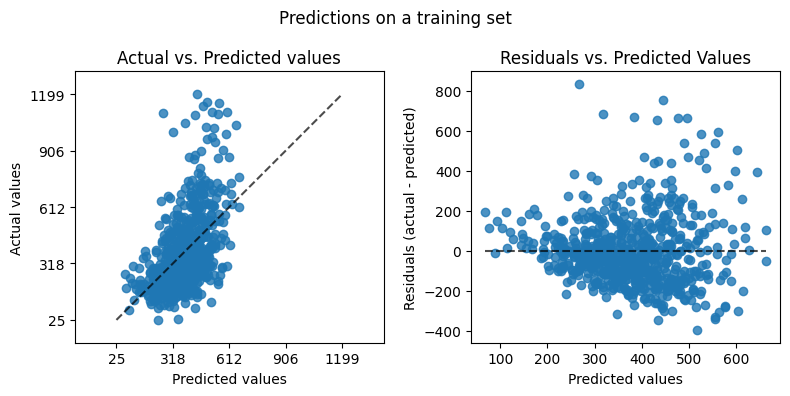

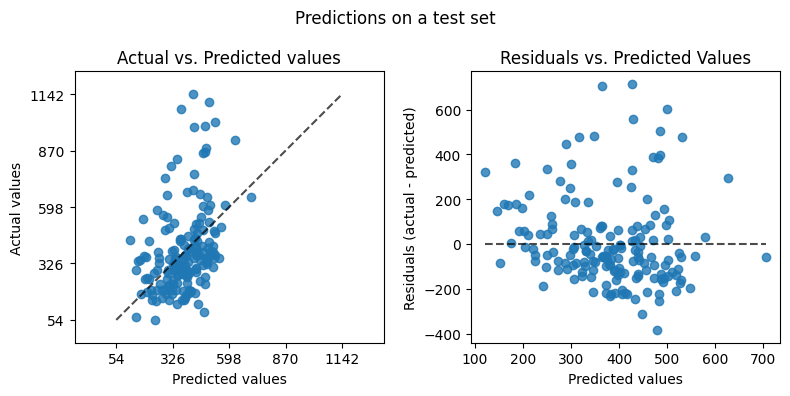

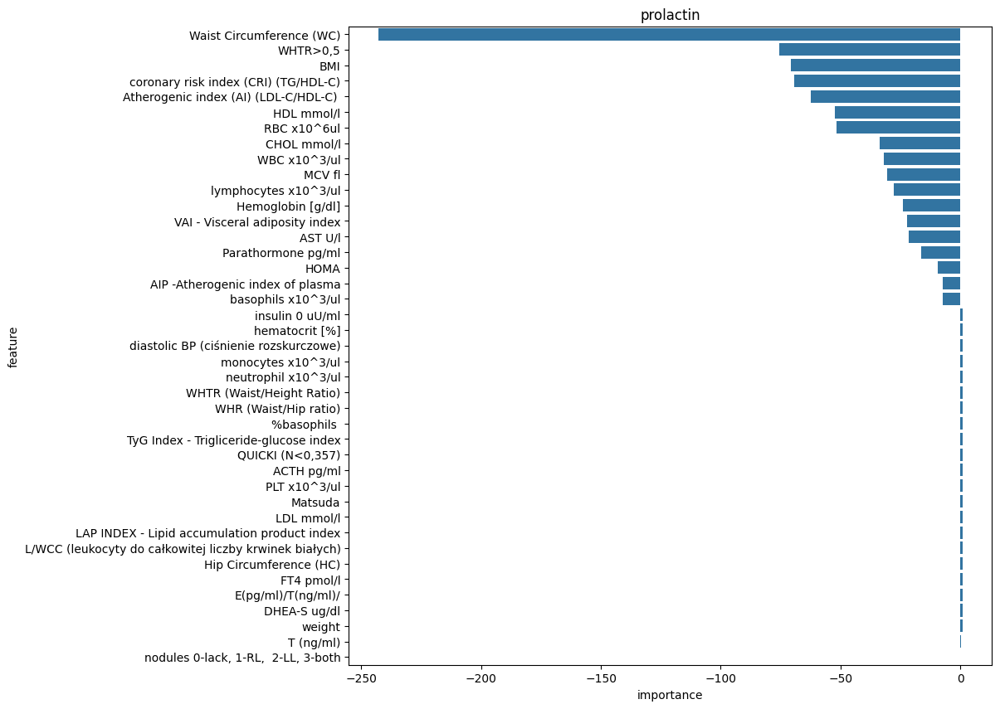

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,28865.625,124.796,169.899,0.265
1,LinearRegression(),test,38823.830,144.575,197.038,0.111


In [22]:
feature_subset = intersection_all_sets

lasso_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, PROLACTIN, X_train_prolactin[feature_subset], y_train_prolactin, X_test_prolactin[feature_subset], y_test_prolactin, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

### SFS Mutual Info

In [28]:
from sklearn.feature_selection import SequentialFeatureSelector as SFS


sfs = SFS(
    estimator = RandomForestRegressor(n_estimators=100, random_state=10), 
    n_features_to_select="auto",
    tol=0.001,
    direction='backward',
    scoring='r2',
    cv=3,
    n_jobs=-1
)

sfs = sfs.fit(X_train_prolactin[selected_features_map['mutual_info']], y_train_prolactin)

In [29]:
best_features_mutual_info = sfs.get_feature_names_out()
len(best_features_mutual_info), best_features_mutual_info

(75,
 array(['glucose 0 mg/dl', 'WBC x10^3/ul', 'hematocrit [%]', 'FT4 pmol/l',
        'SHBG nmol/l', 'weight', 'DHEA-S ug/dl', 'ferritin ng/ml',
        'ACTH pg/ml', 'WHTR (Waist/Height Ratio)', '%basophils ',
        'Anty-TPO IU/ml', 'potassium mmol/l', 'BAI - Body adiposity index',
        'lymphocytes x10^3/ul', 'basophils x10^3/ul', 'FT3 pmol/l',
        'E(pg/ml)/T(ng/ml)/', 'ferrum ug/dl',
        'PCO 0-healthy control, 1-PCOS, 2-FHA 3-POF, 4-High Andro', 'age',
        'CRP mg/l',
        'overweight/obesity 0-normal/low, 1-overweight, 2-obesity',
        'systolic BP (ciśnienie skurczowe)', 'CHOL mmol/l', 'RBC x10^6ul',
        'neutrophil x10^3/ul', 'BMI', 'eosinocytes x10^3/ul', 'MCV fl',
        'Matsuda', 'FTI (free testosterone index)',
        'LAP INDEX - Lipid accumulation product index', 'TIBC', 'HOMA',
        'WC>88', 'IGF-1 ng/ml (N: 100-311)', 'QUICKI (N<0,357)',
        'height (cm)', 'Atherogenic index (AI) (LDL-C/HDL-C) ', 'AST U/l',
        'glucose  120 m

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


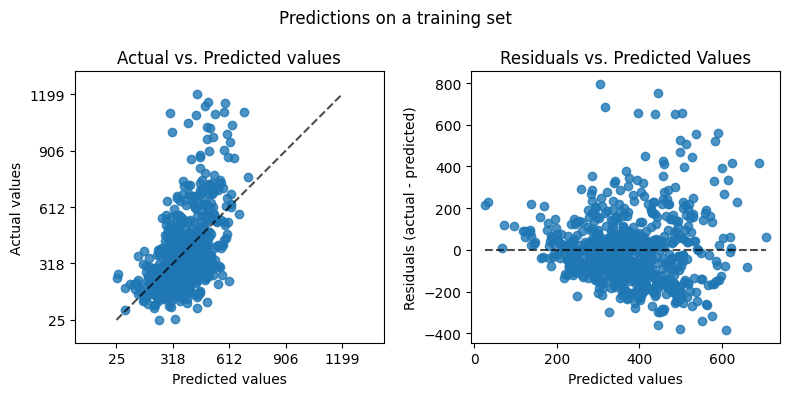

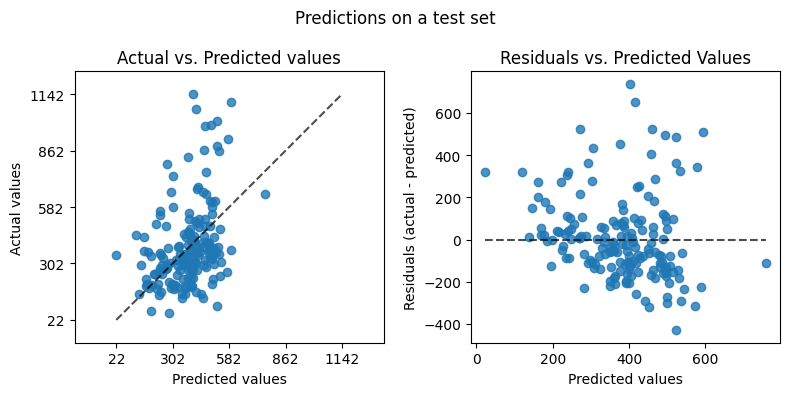

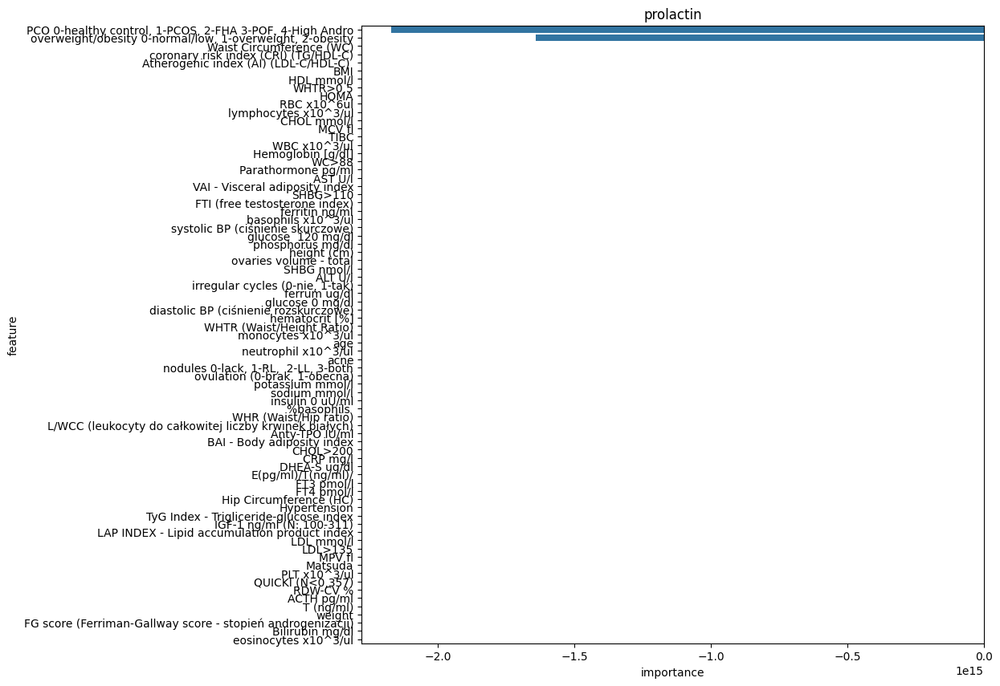

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,27627.918,122.338,166.216,0.297
1,LinearRegression(),test,39625.494,147.873,199.062,0.093


In [39]:
feature_subset = best_features_mutual_info
lasso_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, PROLACTIN, X_train_prolactin[feature_subset], y_train_prolactin, X_test_prolactin[feature_subset], y_test_prolactin, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


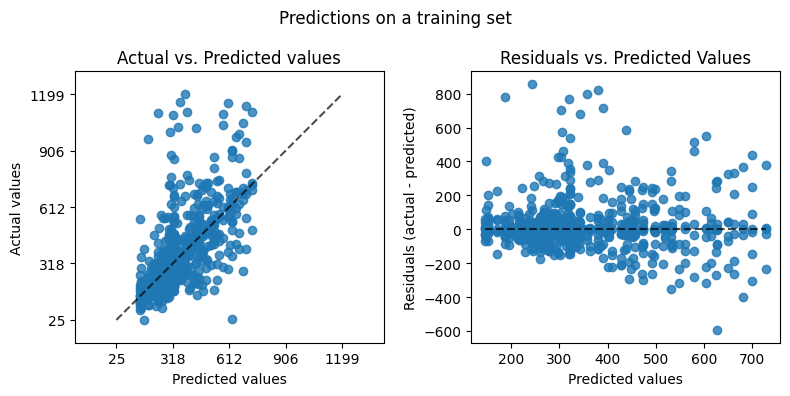

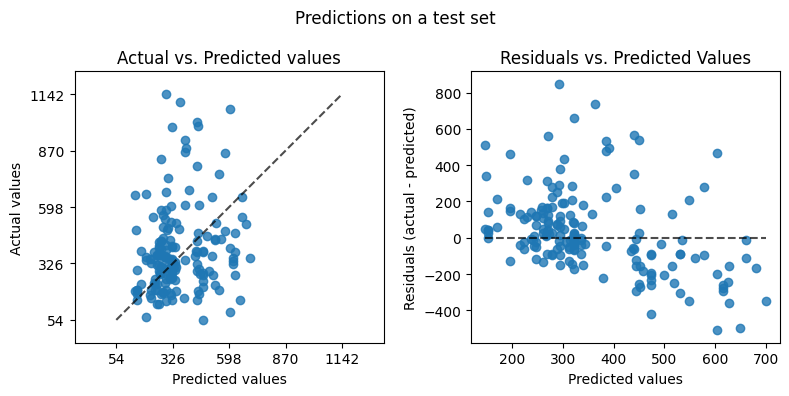

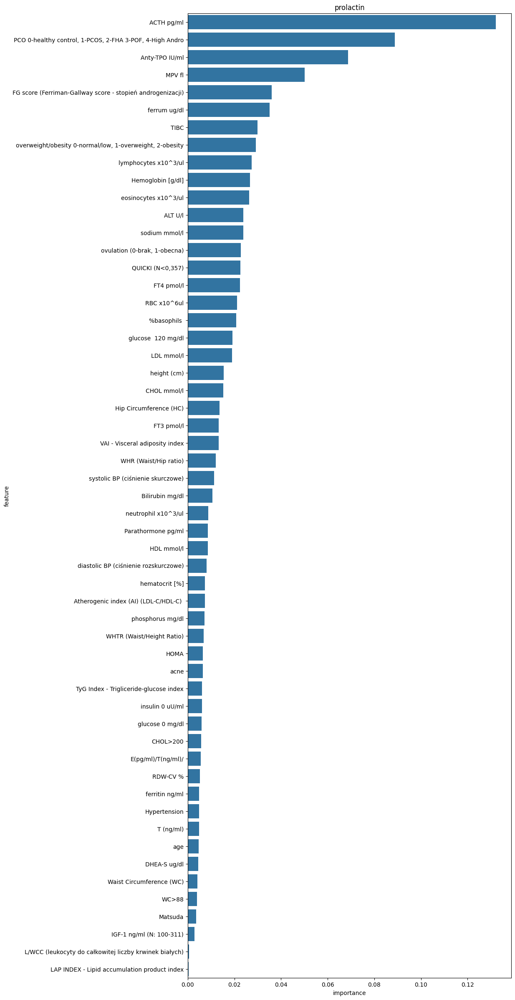

,model,data_set,mse,mae,rmse,r2
0,"DecisionTreeRegressor(criterion='absolute_error', max_depth=15,\n min_samples_leaf=5, min_samples_split=5, random_state=54,\n splitter='random')",training,23381.125,89.166,152.909,0.405
1,"DecisionTreeRegressor(criterion='absolute_error', max_depth=15,\n min_samples_leaf=5, min_samples_split=5, random_state=54,\n splitter='random')",test,51657.501,164.021,227.283,-0.182


In [42]:
feature_subset = best_features_mutual_info

lasso_model = DecisionTreeRegressor(criterion="absolute_error", max_depth=15, min_samples_leaf=5, min_samples_split=5, splitter='random', random_state=54)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, PROLACTIN, X_train_prolactin[feature_subset], y_train_prolactin, X_test_prolactin[feature_subset], y_test_prolactin, continuous_preprocessor, categorical_preprocessor, get_feature_importance_rf)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


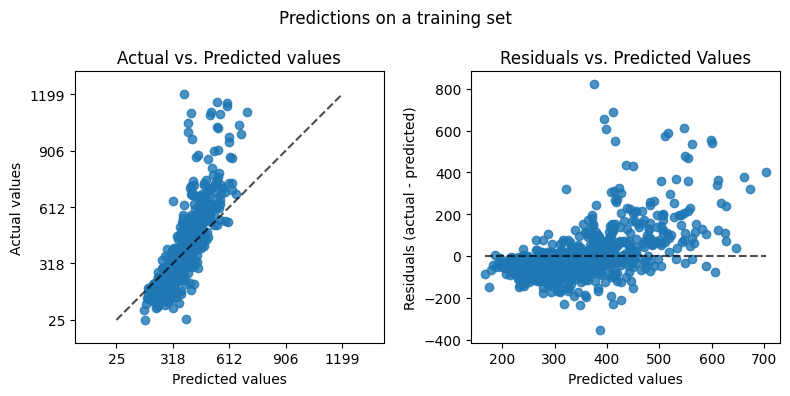

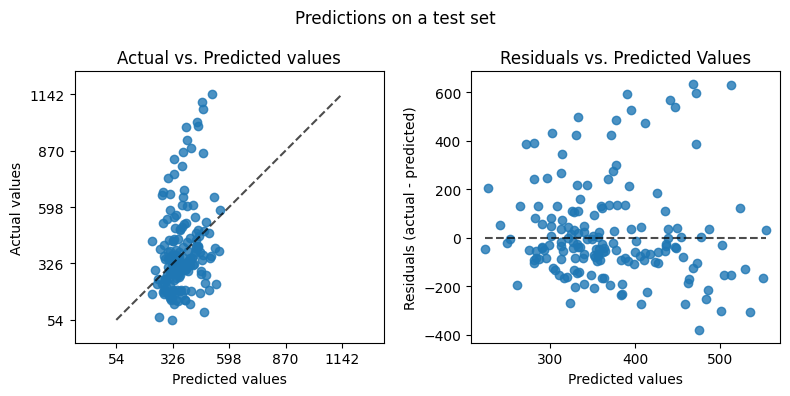

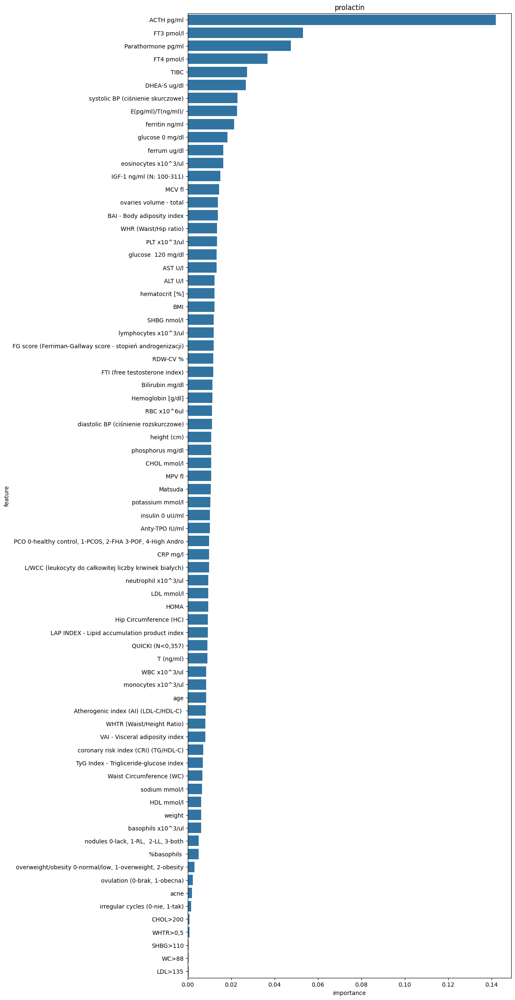

,model,data_set,mse,mae,rmse,r2
0,"RandomForestRegressor(criterion='absolute_error', min_samples_leaf=5,\n min_samples_split=5, random_state=77)",training,17535.137,85.823,132.420,0.554
1,"RandomForestRegressor(criterion='absolute_error', min_samples_leaf=5,\n min_samples_split=5, random_state=77)",test,40631.466,143.328,201.572,0.070


In [38]:
feature_subset = best_features_mutual_info

lasso_model = RandomForestRegressor(n_estimators=100, max_depth=None, min_samples_leaf=5, min_samples_split=5, criterion='absolute_error', random_state=77)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, PROLACTIN, X_train_prolactin[feature_subset], y_train_prolactin, X_test_prolactin[feature_subset], y_test_prolactin, continuous_preprocessor, categorical_preprocessor, get_feature_importance_rf)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


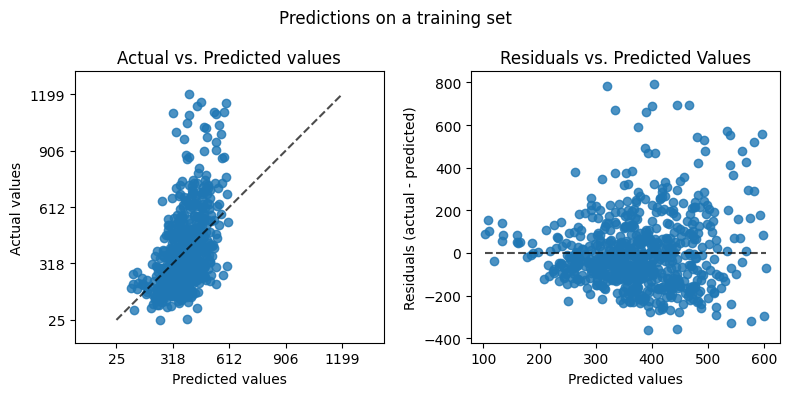

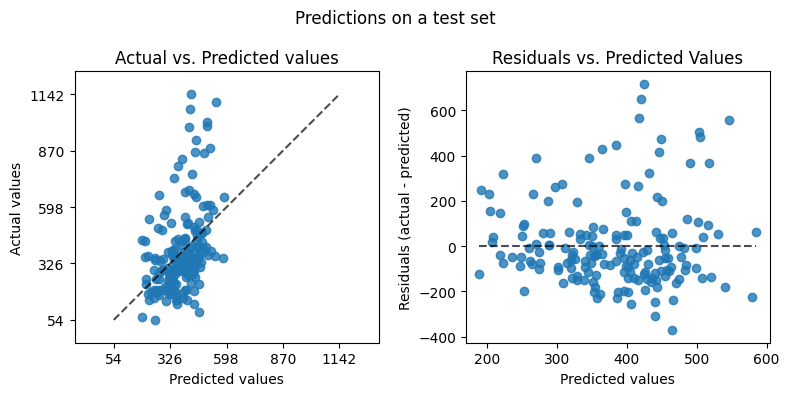

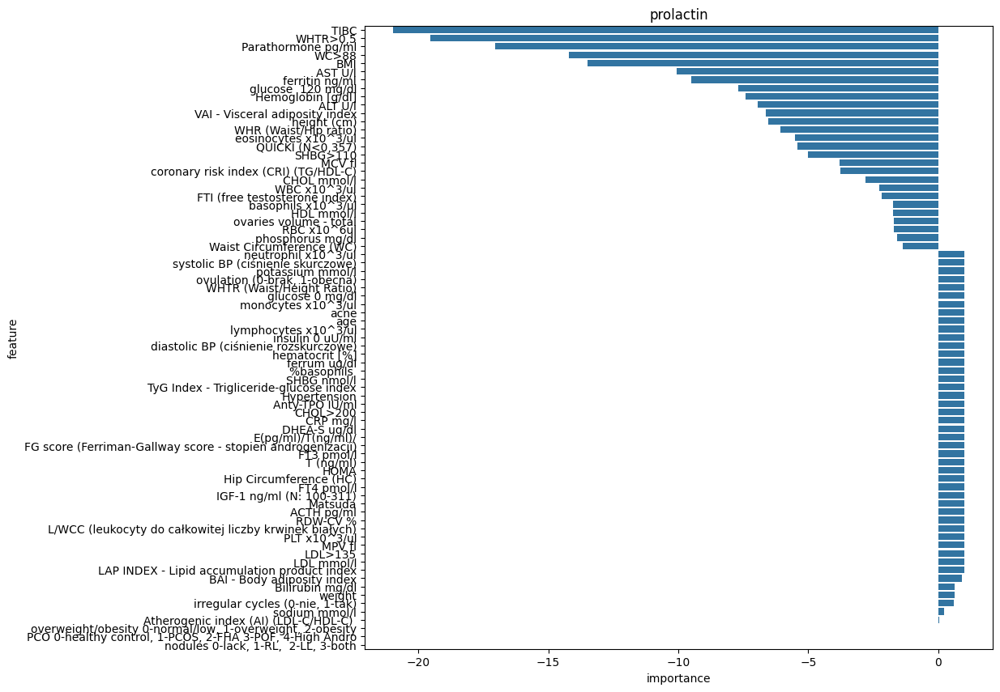

,model,data_set,mse,mae,rmse,r2
0,Ridge(alpha=100),training,29267.801,125.873,171.078,0.255
1,Ridge(alpha=100),test,36416.715,138.469,190.832,0.167


In [37]:
feature_subset = best_features_mutual_info

ridge_model = Ridge(alpha=100)

vit_d_model_scores_df, feature_importnces_ridge = train_model(ridge_model, PROLACTIN, X_train_prolactin[feature_subset], y_train_prolactin, X_test_prolactin[feature_subset], y_test_prolactin, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

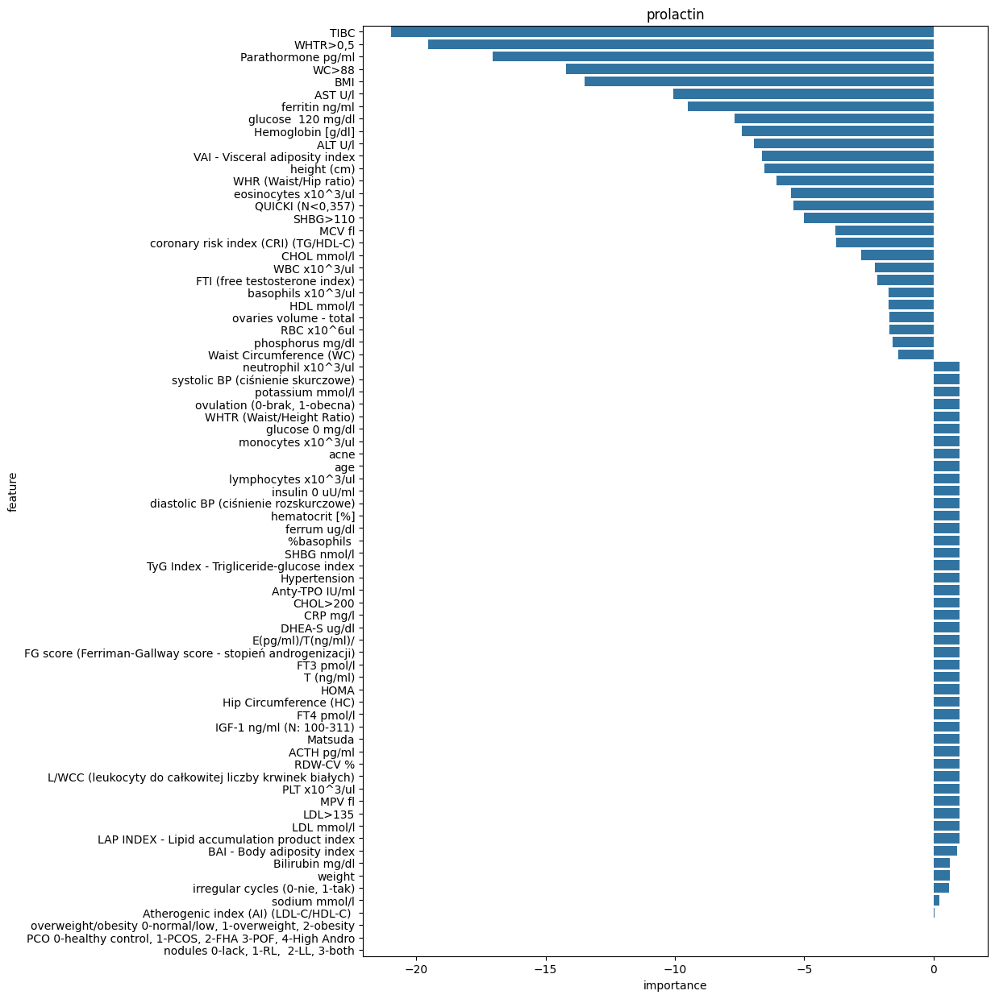

In [45]:
feature_importnces_ridge


plt.figure(figsize=(10, 15))
sns.barplot(feature_importnces_ridge, x="importance", y="feature").set(title=PROLACTIN)
plt.show()


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


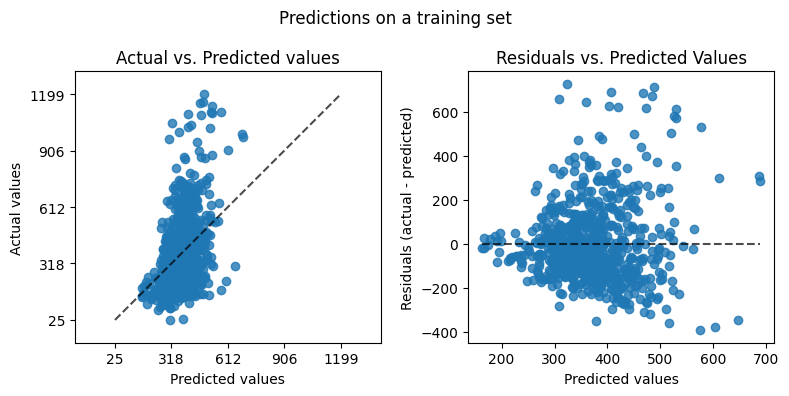

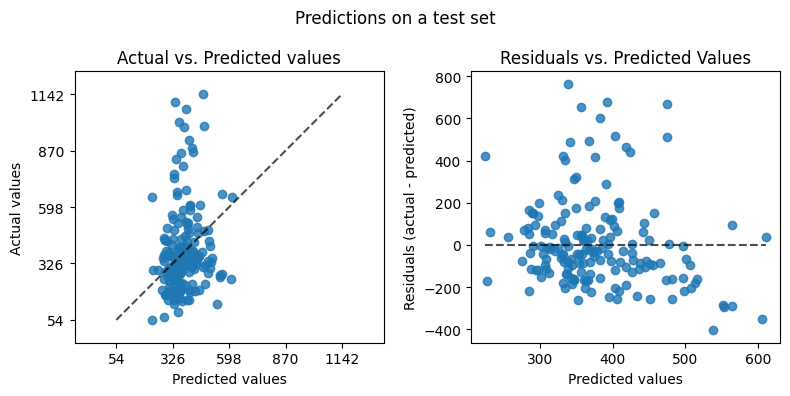

,model,data_set,mse,mae,rmse,r2
0,KNeighborsRegressor(n_neighbors=10),training,32298.020,134.022,179.716,0.178
1,KNeighborsRegressor(n_neighbors=10),test,44426.189,152.222,210.775,-0.017


In [40]:
from sklearn.neighbors import KNeighborsRegressor

feature_subset = best_features_mutual_info

knn_model = KNeighborsRegressor(n_neighbors=10)

vit_d_model_scores_df, feature_importnces_knn = train_model(knn_model, PROLACTIN, X_train_prolactin[feature_subset], y_train_prolactin, X_test_prolactin[feature_subset], y_test_prolactin, continuous_preprocessor, categorical_preprocessor, get_feature_importance_knn)
vit_d_model_scores_df


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


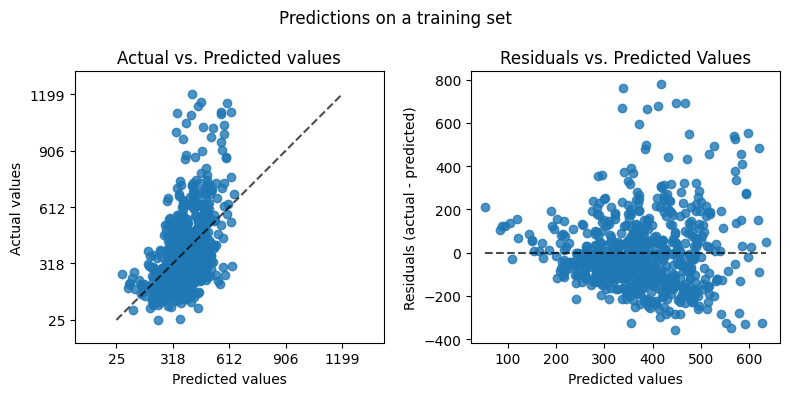

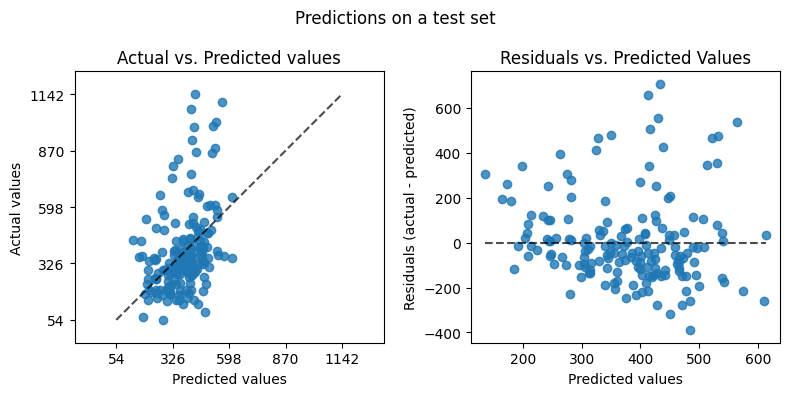

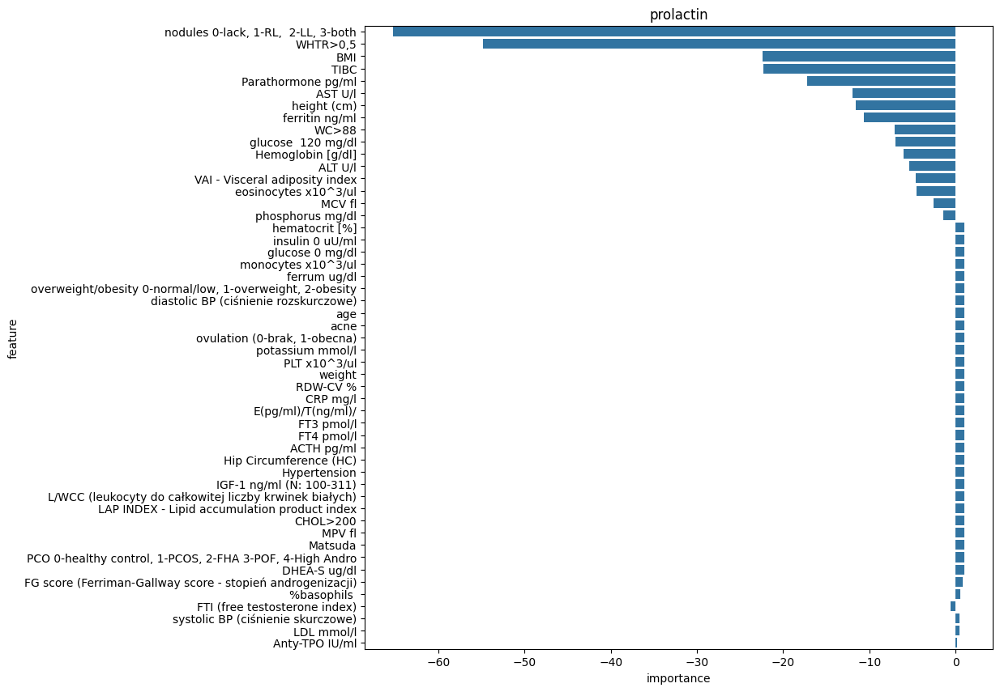

,model,data_set,mse,mae,rmse,r2
0,Lasso(alpha=1),training,28750.979,124.587,169.561,0.268
1,Lasso(alpha=1),test,38016.462,140.982,194.978,0.130


In [41]:

feature_subset = best_features_mutual_info


lasso_model = Lasso(alpha=1)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, PROLACTIN, X_train_prolactin[feature_subset], y_train_prolactin, X_test_prolactin[feature_subset], y_test_prolactin, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

### SFS Permutation Importance

In [30]:
from sklearn.feature_selection import SequentialFeatureSelector as SFS


sfs = SFS(
    estimator = RandomForestRegressor(n_estimators=100, random_state=10), 
    n_features_to_select="auto",
    tol=0.001,
    direction='backward',
    scoring='r2',
    cv=3,
    n_jobs=-1
)

sfs_p = sfs.fit(X_train_prolactin[selected_features_map['permutation_importance']], y_train_prolactin)

best_features_permutation = sfs_p.get_feature_names_out()
len(best_features_permutation), best_features_permutation

(54,
 array(['neutrophil x10^3/ul', 'TyG Index - Trigliceride-glucose index',
        'TG mmol/l', 'Waist Circumference (WC)', 'insulin 0 uU/ml',
        'NLR (stosunek neutrofili do limfocytów)', 'eos/leukocyty', 'HOMA',
        'WHTR (Waist/Height Ratio)', 'WBC x10^3/ul',
        'Atherogenic index (AI) (LDL-C/HDL-C) ', 'LDL mmol/l',
        'Hemoglobin [g/dl]', 'coronary risk index (CRI) (TG/HDL-C)',
        '%eosinocytes ', 'weight', 'Estradiol pg/ml',
        'AIP -Atherogenic index of plasma',
        'LAP INDEX - Lipid accumulation product index',
        'Hip Circumference (HC)', 'MPV/PLT', 'P-LCR %', 'hematocrit [%]',
        'PLR', 'ACTH pg/ml', 'HTC/Hb', 'E(pg/ml)/T(ng/ml)/', 'HDL mmol/l',
        'PLT/WBC', 'Matsuda', 'monocytes x10^3/ul',
        'VAI - Visceral adiposity index', 'limf/mono',
        'lymphocytes x10^3/ul', 'FT4 pmol/l', 'T (ng/ml)',
        '% lymphocytes ', 'RBC x10^6ul', 'CHOL mmol/l', 'WHTR>0,5',
        'DHEA-S ug/dl', 'TSH mIU/L', 'QUICKI (N<0,357)',

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


selected 54 features


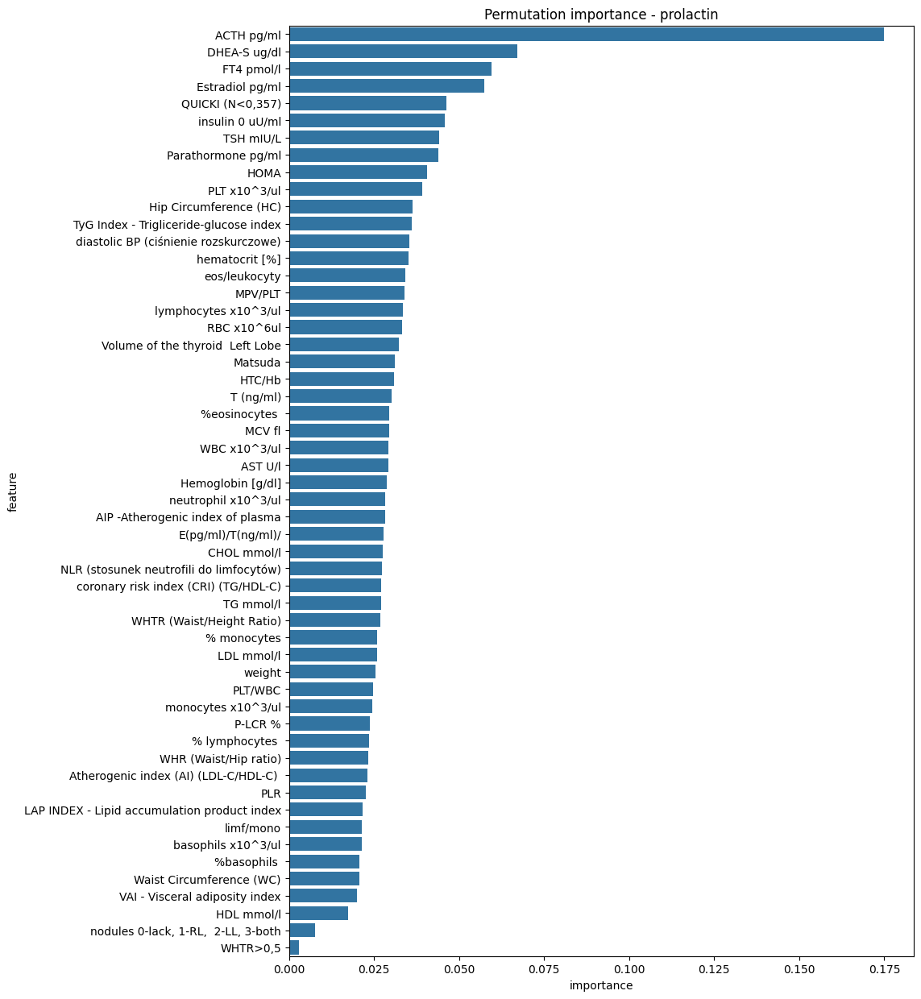

,feature,importance
24,ACTH pg/ml,0.174842
40,DHEA-S ug/dl,0.067065
34,FT4 pmol/l,0.059503
16,Estradiol pg/ml,0.057328
42,"QUICKI (N<0,357)",0.046327
4,insulin 0 uU/ml,0.045826
41,TSH mIU/L,0.044230
52,Parathormone pg/ml,0.043982
7,HOMA,0.040662
45,PLT x10^3/ul,0.039244


In [36]:
selected_features_permutation_importance = get_permutation_importance(X_train_prolactin[best_features_permutation], y_train_prolactin, 
                                                                      RandomForestRegressor(n_estimators=100, max_depth=None, max_features='sqrt', min_samples_leaf=3, min_samples_split=3, criterion='absolute_error', random_state=56),
                                                                        continuous_preprocessor, categorical_preprocessor, PROLACTIN, figsize=(10, 15))
selected_features_permutation_importance

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


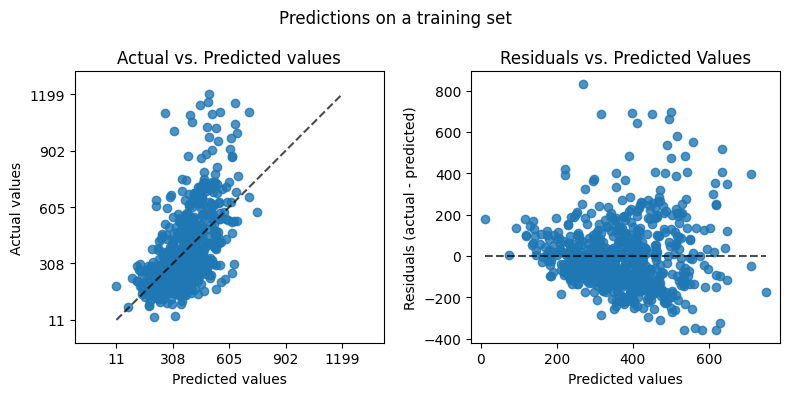

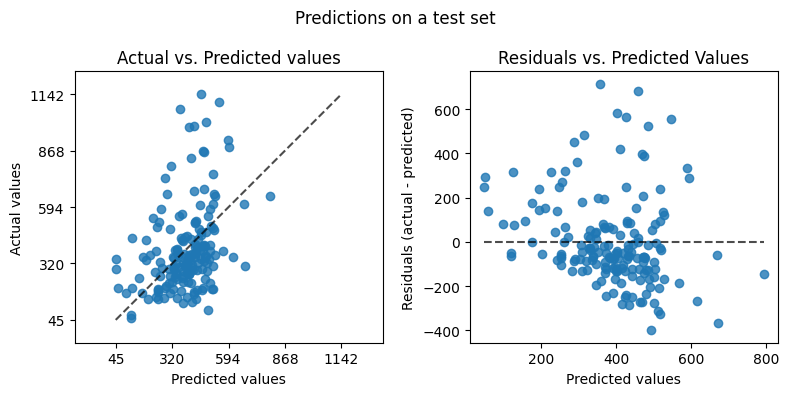

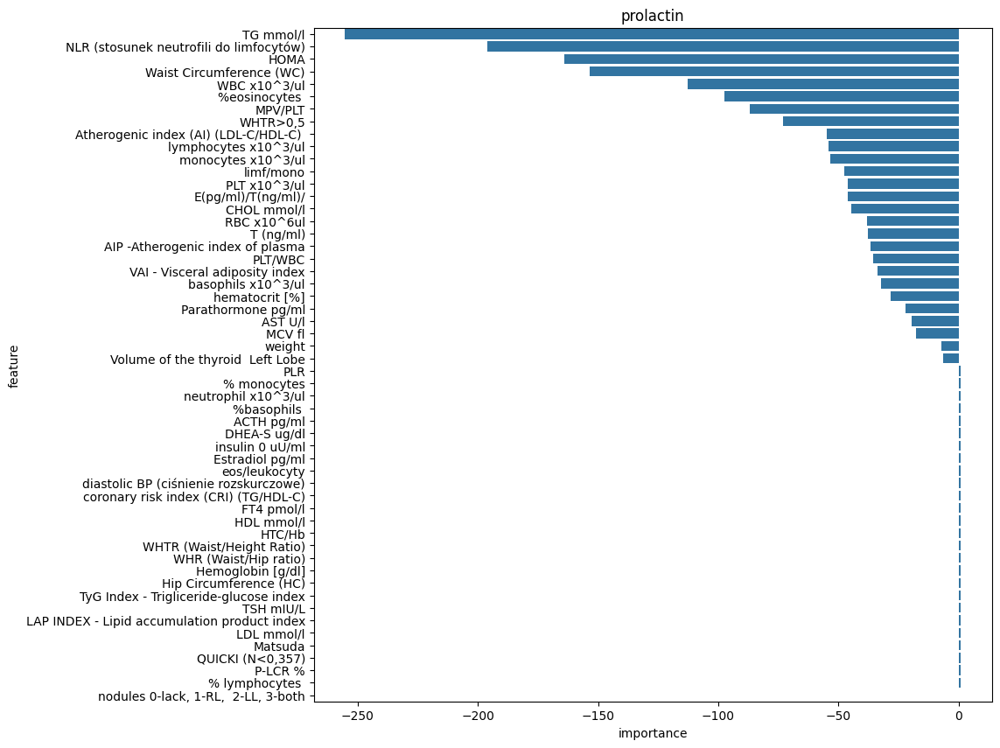

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,27066.473,121.074,164.519,0.311
1,LinearRegression(),test,40680.981,149.897,201.695,0.069


In [31]:
feature_subset = best_features_permutation

lr_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lr = train_model(lr_model, PROLACTIN, X_train_prolactin[feature_subset], y_train_prolactin, X_test_prolactin[feature_subset], y_test_prolactin, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


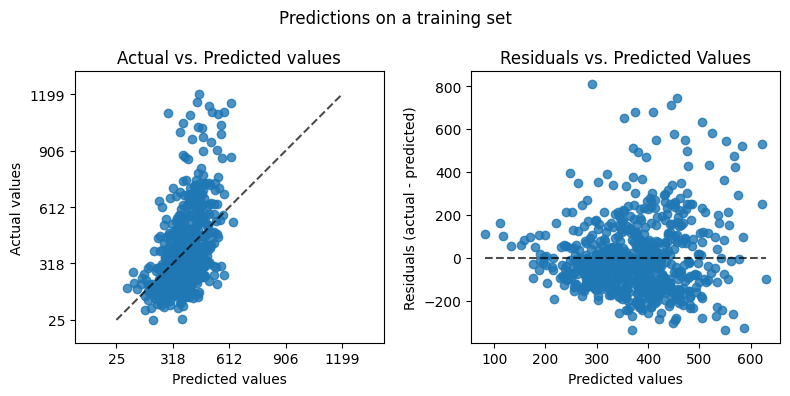

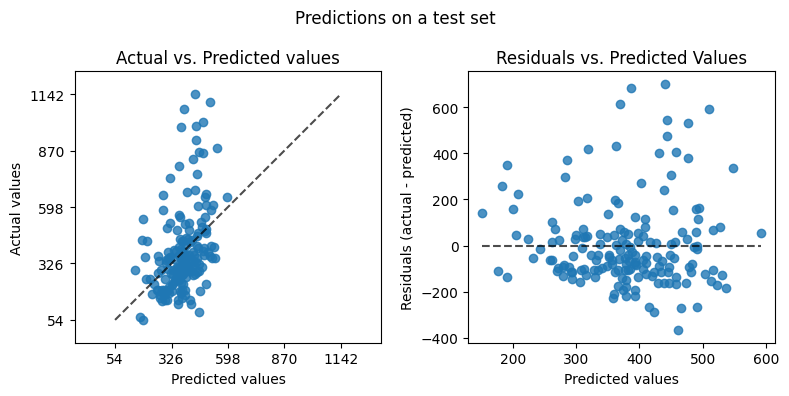

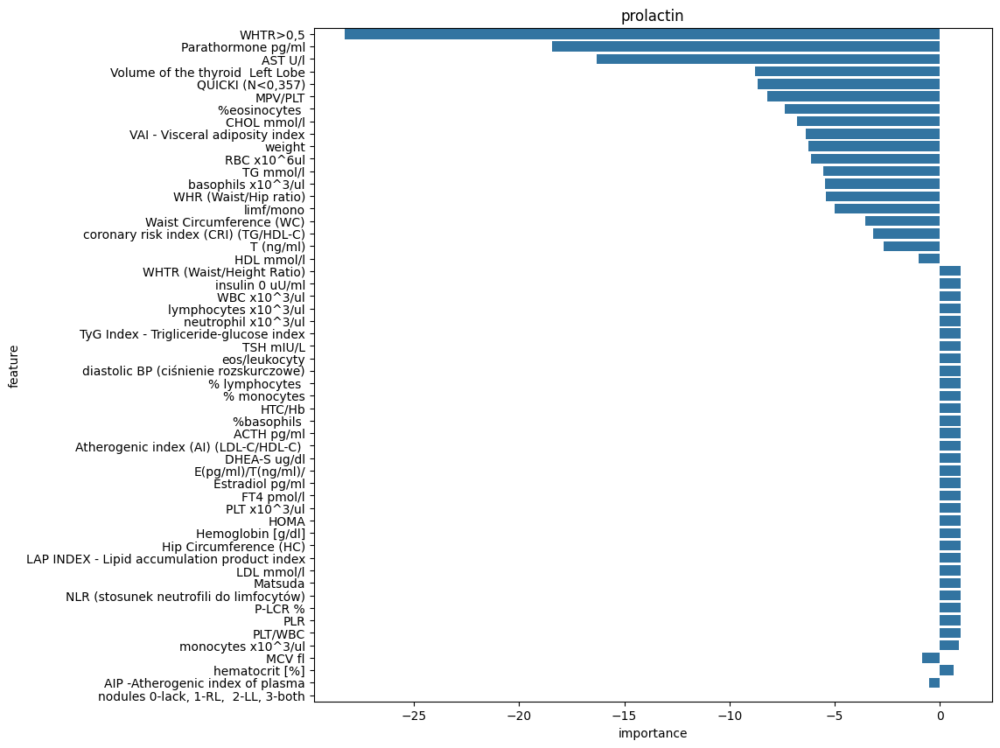

,model,data_set,mse,mae,rmse,r2
0,Ridge(alpha=100),training,29341.794,126.705,171.294,0.253
1,Ridge(alpha=100),test,36688.317,138.203,191.542,0.160


In [33]:
feature_subset = best_features_permutation


ridge_model = Ridge(alpha=100)

vit_d_model_scores_df, feature_importnces_ridge = train_model(ridge_model, PROLACTIN, X_train_prolactin[feature_subset], y_train_prolactin, X_test_prolactin[feature_subset], y_test_prolactin, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


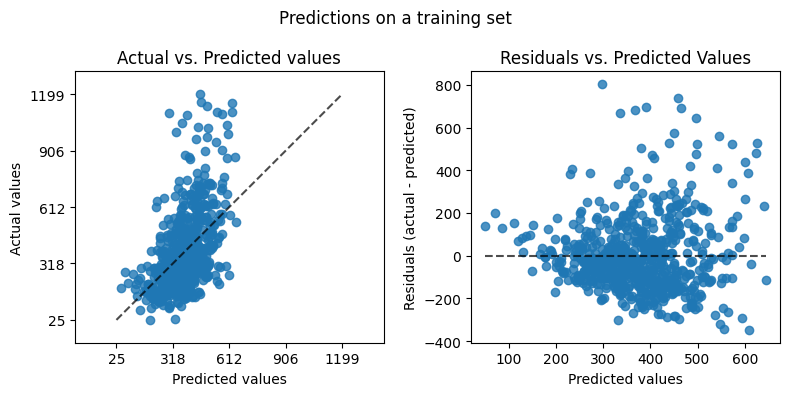

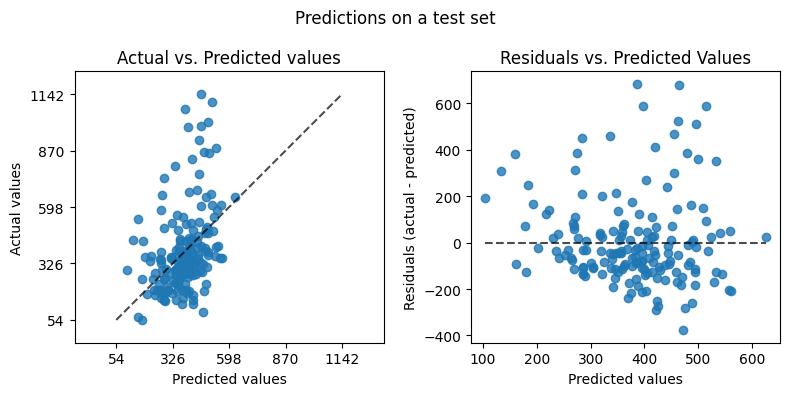

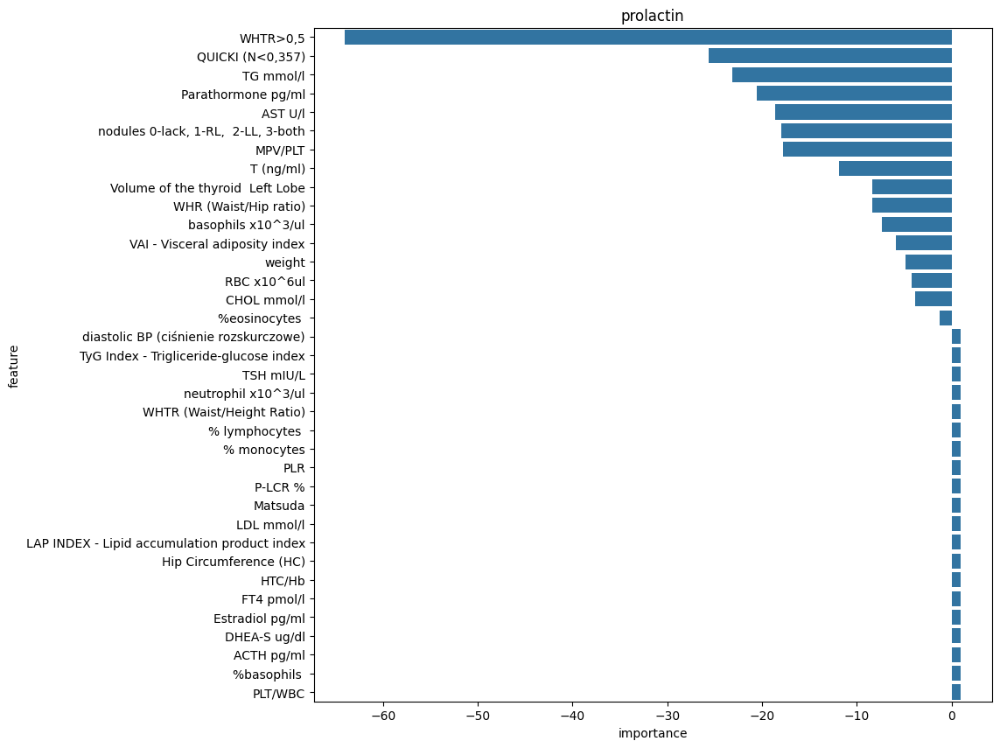

,model,data_set,mse,mae,rmse,r2
0,Lasso(alpha=1),training,28629.028,125.113,169.201,0.271
1,Lasso(alpha=1),test,37325.158,139.888,193.197,0.146


In [32]:
feature_subset = best_features_permutation


lasso_model = Lasso(alpha=1)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, PROLACTIN, X_train_prolactin[feature_subset], y_train_prolactin, X_test_prolactin[feature_subset], y_test_prolactin, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


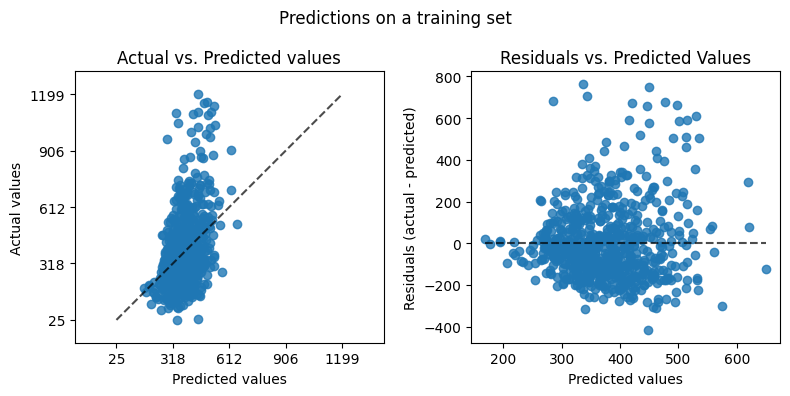

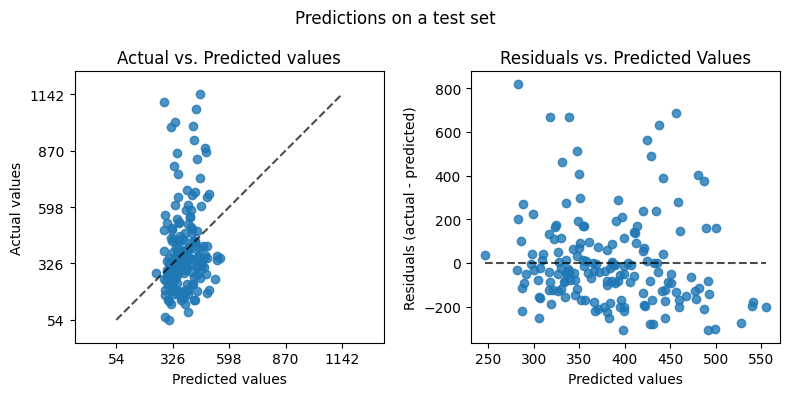

,model,data_set,mse,mae,rmse,r2
0,KNeighborsRegressor(n_neighbors=10),training,32348.508,134.795,179.857,0.176
1,KNeighborsRegressor(n_neighbors=10),test,43457.203,151.086,208.464,0.005


In [34]:
from sklearn.neighbors import KNeighborsRegressor

feature_subset = best_features_permutation

knn_model = KNeighborsRegressor(n_neighbors=10)

vit_d_model_scores_df, feature_importnces_knn = train_model(knn_model, PROLACTIN, X_train_prolactin[feature_subset], y_train_prolactin, X_test_prolactin[feature_subset], y_test_prolactin, continuous_preprocessor, categorical_preprocessor, get_feature_importance_knn)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


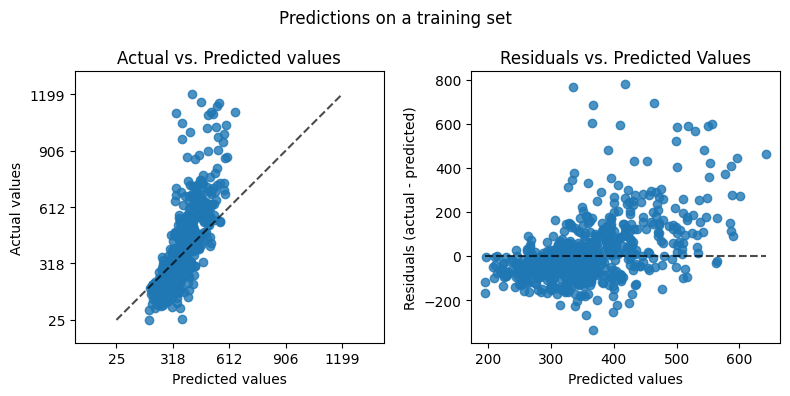

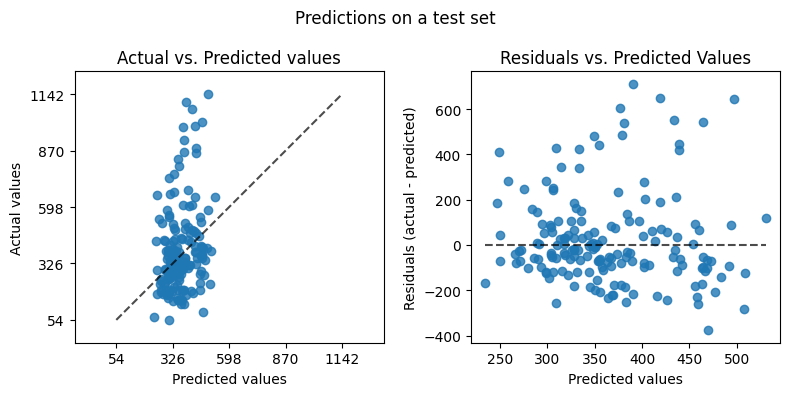

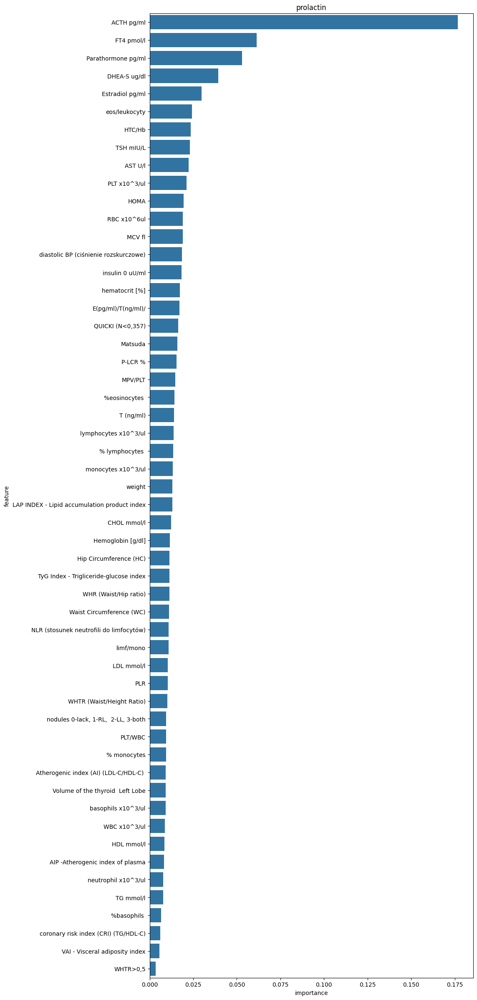

,model,data_set,mse,mae,rmse,r2
0,"RandomForestRegressor(criterion='absolute_error', min_samples_leaf=5,\n min_samples_split=5, random_state=77)",training,21234.166,96.538,145.719,0.459
1,"RandomForestRegressor(criterion='absolute_error', min_samples_leaf=5,\n min_samples_split=5, random_state=77)",test,41208.947,143.704,203.000,0.057


In [35]:
feature_subset = best_features_permutation

lasso_model = RandomForestRegressor(n_estimators=100, max_depth=None, min_samples_leaf=5, min_samples_split=5, criterion='absolute_error', random_state=77)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, PROLACTIN, X_train_prolactin[feature_subset], y_train_prolactin, X_test_prolactin[feature_subset], y_test_prolactin, continuous_preprocessor, categorical_preprocessor, get_feature_importance_rf)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


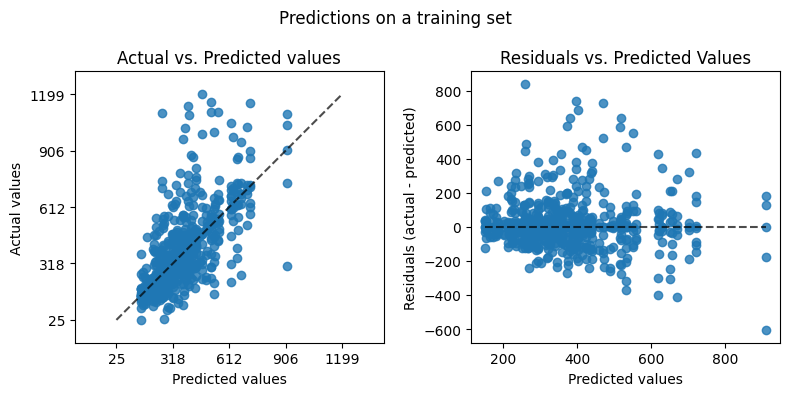

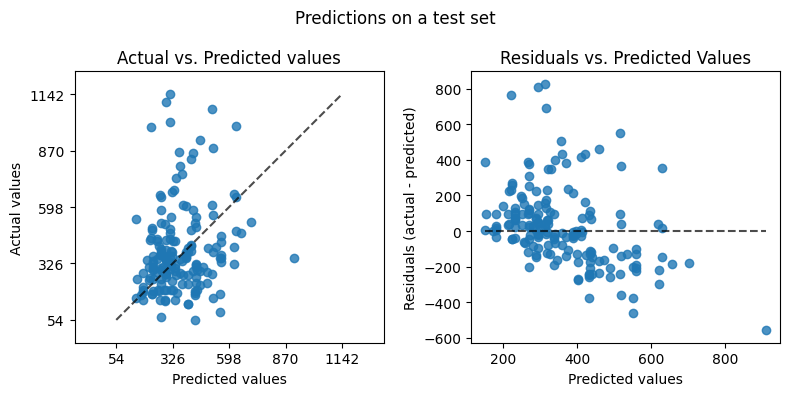

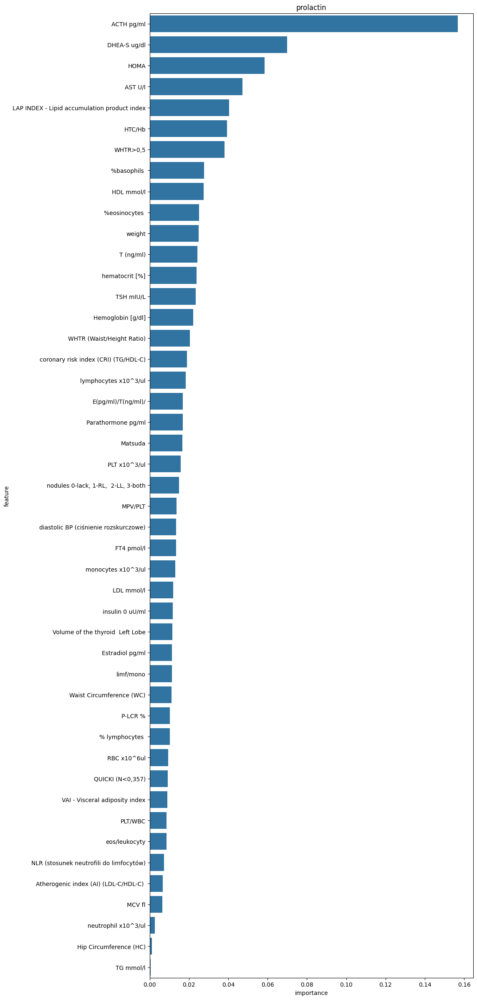

,model,data_set,mse,mae,rmse,r2
0,"DecisionTreeRegressor(criterion='absolute_error', max_depth=15,\n min_samples_leaf=5, min_samples_split=5, random_state=54,\n splitter='random')",training,21454.179,87.543,146.472,0.454
1,"DecisionTreeRegressor(criterion='absolute_error', max_depth=15,\n min_samples_leaf=5, min_samples_split=5, random_state=54,\n splitter='random')",test,51142.136,162.574,226.146,-0.170


In [43]:
feature_subset = best_features_permutation

lasso_model = DecisionTreeRegressor(criterion="absolute_error", max_depth=15, min_samples_leaf=5, min_samples_split=5, splitter='random', random_state=54)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, PROLACTIN, X_train_prolactin[feature_subset], y_train_prolactin, X_test_prolactin[feature_subset], y_test_prolactin, continuous_preprocessor, categorical_preprocessor, get_feature_importance_rf)
vit_d_model_scores_df